# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:09<00:00, 6.02KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

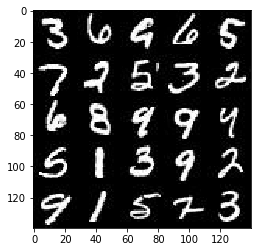

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

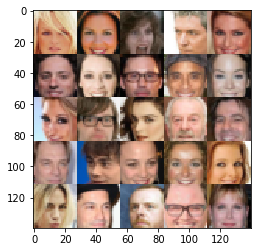

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


/disk1/scratch/ml/anaconda3/envs/tensorflow/lib/python3.5/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [8]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_image   = tf.placeholder(tf.float32, shape=(None, image_height, image_width, image_channels))
    z_data_tensor = tf.placeholder(tf.float32, shape=(None, z_dim))
    learning_rate = tf.placeholder(tf.float32, shape=())

    return input_image, z_data_tensor, learning_rate

def lrelu(x, alpha=0.1):
    return tf.maximum(x * alpha, x)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [11]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    kinit = tf.random_normal_initializer(stddev=0.02)
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input is 28x28x3
        l1     = tf.layers.conv2d(images, 64, 5, strides=2, kernel_initializer=kinit, padding='same')
        lrelu1 = lrelu(l1)
        # 14x14x64
        
        l2     = tf.layers.conv2d(lrelu1, 128, 5, strides=2, kernel_initializer=kinit, padding='same')
        bn2    = tf.layers.batch_normalization(l2, training=True)
        lrelu2 = lrelu(bn2)        
        # 7x7x128
        
        l3     = tf.layers.conv2d(lrelu2, 256, 5, strides=2, kernel_initializer=kinit, padding='same')
        bn3    = tf.layers.batch_normalization(l3, training=True)
        lrelu3 = lrelu(bn3)
        # 4x4x256
        
        flat   = tf.reshape(lrelu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out    = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [14]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
       
    kinit = tf.random_normal_initializer(stddev=0.02)
    
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer
        l1 = tf.layers.dense(z, 7*7*256)        
        l1 = tf.reshape(l1, (-1, 7, 7, 256))                
        l1 = tf.layers.batch_normalization(l1, training=is_train)
        l1 = lrelu(l1)
        # 7x7x256
        
        l2 = tf.layers.conv2d_transpose(l1, 128, 5, strides=2, kernel_initializer=kinit, padding='same')
        l2 = tf.layers.batch_normalization(l2, training=is_train)
        l2 = lrelu(l2)
        # 14x14x128
        
        l3 = tf.layers.conv2d_transpose(l2, 64, 5, strides=2, kernel_initializer=kinit, padding='same')        
        l3 = tf.layers.batch_normalization(l3, training=is_train)
        l3 = lrelu(l3)
        # 28x28x64
        
        logits = tf.layers.conv2d_transpose(l3, out_channel_dim, 3, strides=1, kernel_initializer=kinit, padding='same')
        # 28x28x3
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [16]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_real_out, d_real_logits = discriminator(input_real)
    d_fake_out, d_fake_logits = discriminator(g_model, reuse=True)
    
    # Inits
    smooth = 0.1
    real_labels = tf.ones_like(d_real_out) * (1 - smooth)
    fake_labels = tf.zeros_like(d_fake_out)
    g_labels    = tf.ones_like(d_fake_out)

    d_real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_real_logits, labels=real_labels))
    d_fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits, labels=fake_labels))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits, labels=g_labels))

    d_loss = d_real_loss + d_fake_loss
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [28]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get Weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    d_updates = [opt for opt in update_ops if opt.name.startswith('discriminator')]
    g_updates = [opt for opt in update_ops if opt.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(d_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
            
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [18]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [25]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt   = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps       = 0
    print_every = 10
    show_every  = 100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # Train Model
                steps += 1
                batch_images *= 2.0
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.8732... Generator Loss: 1.1876
Epoch 1/2... Discriminator Loss: 0.7495... Generator Loss: 1.6274
Epoch 1/2... Discriminator Loss: 0.8242... Generator Loss: 1.2028
Epoch 1/2... Discriminator Loss: 0.4959... Generator Loss: 2.3379
Epoch 1/2... Discriminator Loss: 0.5226... Generator Loss: 2.5449
Epoch 1/2... Discriminator Loss: 0.6311... Generator Loss: 3.0081
Epoch 1/2... Discriminator Loss: 0.7902... Generator Loss: 3.6608
Epoch 1/2... Discriminator Loss: 0.6306... Generator Loss: 2.3532
Epoch 1/2... Discriminator Loss: 0.6931... Generator Loss: 1.5072
Epoch 1/2... Discriminator Loss: 0.6461... Generator Loss: 2.1911


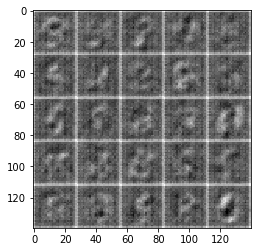

Epoch 1/2... Discriminator Loss: 0.8230... Generator Loss: 1.1610
Epoch 1/2... Discriminator Loss: 0.7281... Generator Loss: 1.7994
Epoch 1/2... Discriminator Loss: 0.8885... Generator Loss: 1.0293
Epoch 1/2... Discriminator Loss: 1.2875... Generator Loss: 0.6046
Epoch 1/2... Discriminator Loss: 0.7610... Generator Loss: 1.3135
Epoch 1/2... Discriminator Loss: 0.6718... Generator Loss: 1.6634
Epoch 1/2... Discriminator Loss: 0.9051... Generator Loss: 1.0557
Epoch 1/2... Discriminator Loss: 0.7332... Generator Loss: 1.7585
Epoch 1/2... Discriminator Loss: 0.7235... Generator Loss: 1.7776
Epoch 1/2... Discriminator Loss: 0.7447... Generator Loss: 1.5767


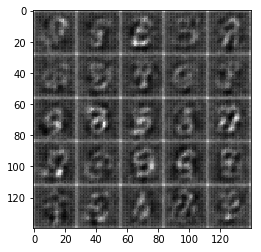

Epoch 1/2... Discriminator Loss: 1.1167... Generator Loss: 2.7968
Epoch 1/2... Discriminator Loss: 0.7821... Generator Loss: 1.2344
Epoch 1/2... Discriminator Loss: 0.7161... Generator Loss: 1.6459
Epoch 1/2... Discriminator Loss: 1.3730... Generator Loss: 0.4979
Epoch 1/2... Discriminator Loss: 0.7333... Generator Loss: 1.7360
Epoch 1/2... Discriminator Loss: 0.6788... Generator Loss: 1.9772
Epoch 1/2... Discriminator Loss: 0.7317... Generator Loss: 1.4879
Epoch 1/2... Discriminator Loss: 0.7019... Generator Loss: 1.4191
Epoch 1/2... Discriminator Loss: 1.0042... Generator Loss: 0.8440
Epoch 1/2... Discriminator Loss: 0.6802... Generator Loss: 1.6180


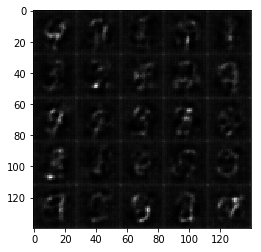

Epoch 1/2... Discriminator Loss: 0.7088... Generator Loss: 2.1144
Epoch 1/2... Discriminator Loss: 0.7100... Generator Loss: 2.3625
Epoch 1/2... Discriminator Loss: 0.7365... Generator Loss: 2.0868
Epoch 1/2... Discriminator Loss: 1.3196... Generator Loss: 0.5725
Epoch 1/2... Discriminator Loss: 0.7897... Generator Loss: 1.2788
Epoch 1/2... Discriminator Loss: 0.6802... Generator Loss: 1.9298
Epoch 1/2... Discriminator Loss: 0.7773... Generator Loss: 1.2907
Epoch 1/2... Discriminator Loss: 0.7758... Generator Loss: 1.9711
Epoch 1/2... Discriminator Loss: 0.6810... Generator Loss: 1.6673
Epoch 1/2... Discriminator Loss: 0.6498... Generator Loss: 2.6508


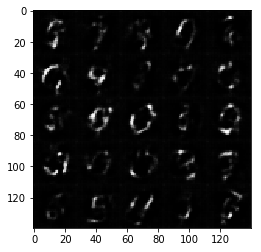

Epoch 1/2... Discriminator Loss: 0.6299... Generator Loss: 1.7405
Epoch 1/2... Discriminator Loss: 0.6818... Generator Loss: 1.6530
Epoch 1/2... Discriminator Loss: 0.7004... Generator Loss: 2.3551
Epoch 1/2... Discriminator Loss: 0.8226... Generator Loss: 2.6749
Epoch 1/2... Discriminator Loss: 0.6680... Generator Loss: 1.5441
Epoch 1/2... Discriminator Loss: 0.7361... Generator Loss: 2.5963
Epoch 1/2... Discriminator Loss: 0.6165... Generator Loss: 1.9193
Epoch 1/2... Discriminator Loss: 0.8246... Generator Loss: 1.1621
Epoch 1/2... Discriminator Loss: 0.6574... Generator Loss: 1.6284
Epoch 1/2... Discriminator Loss: 0.6664... Generator Loss: 1.5499


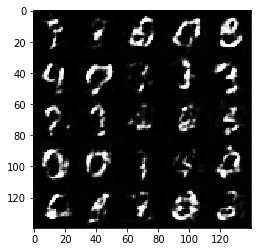

Epoch 1/2... Discriminator Loss: 0.6473... Generator Loss: 2.1252
Epoch 1/2... Discriminator Loss: 0.7155... Generator Loss: 2.0248
Epoch 1/2... Discriminator Loss: 0.5675... Generator Loss: 1.9119
Epoch 1/2... Discriminator Loss: 1.5185... Generator Loss: 0.4877
Epoch 1/2... Discriminator Loss: 0.6289... Generator Loss: 1.8533
Epoch 1/2... Discriminator Loss: 0.5995... Generator Loss: 2.0498
Epoch 1/2... Discriminator Loss: 0.7834... Generator Loss: 1.5136
Epoch 1/2... Discriminator Loss: 0.8563... Generator Loss: 2.2572
Epoch 1/2... Discriminator Loss: 0.6688... Generator Loss: 1.8682
Epoch 1/2... Discriminator Loss: 0.7212... Generator Loss: 1.4241


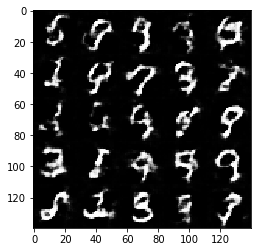

Epoch 1/2... Discriminator Loss: 0.8546... Generator Loss: 2.5854
Epoch 1/2... Discriminator Loss: 0.7356... Generator Loss: 2.4996
Epoch 1/2... Discriminator Loss: 0.7223... Generator Loss: 1.9158
Epoch 1/2... Discriminator Loss: 0.8328... Generator Loss: 2.0030
Epoch 1/2... Discriminator Loss: 0.7645... Generator Loss: 1.3665
Epoch 1/2... Discriminator Loss: 0.7793... Generator Loss: 1.6844
Epoch 1/2... Discriminator Loss: 1.0382... Generator Loss: 0.8493
Epoch 1/2... Discriminator Loss: 0.7781... Generator Loss: 1.6163
Epoch 1/2... Discriminator Loss: 0.8100... Generator Loss: 1.2576
Epoch 1/2... Discriminator Loss: 0.8021... Generator Loss: 2.0048


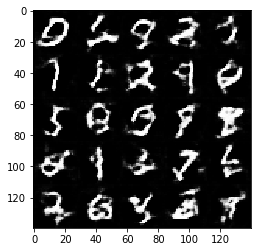

Epoch 1/2... Discriminator Loss: 0.9882... Generator Loss: 0.8868
Epoch 1/2... Discriminator Loss: 0.7508... Generator Loss: 1.3461
Epoch 1/2... Discriminator Loss: 0.6870... Generator Loss: 1.7858
Epoch 1/2... Discriminator Loss: 0.9983... Generator Loss: 2.0111
Epoch 1/2... Discriminator Loss: 0.7689... Generator Loss: 1.3806
Epoch 1/2... Discriminator Loss: 0.8502... Generator Loss: 1.7688
Epoch 1/2... Discriminator Loss: 0.9050... Generator Loss: 1.5943
Epoch 1/2... Discriminator Loss: 1.0752... Generator Loss: 0.7790
Epoch 1/2... Discriminator Loss: 1.1316... Generator Loss: 0.7187
Epoch 1/2... Discriminator Loss: 0.8778... Generator Loss: 2.1858


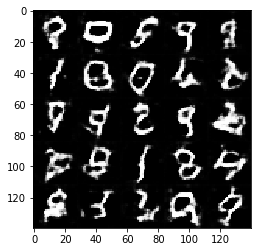

Epoch 1/2... Discriminator Loss: 0.9255... Generator Loss: 1.0365
Epoch 1/2... Discriminator Loss: 0.9645... Generator Loss: 2.4008
Epoch 1/2... Discriminator Loss: 1.1726... Generator Loss: 2.3122
Epoch 1/2... Discriminator Loss: 0.9143... Generator Loss: 1.7111
Epoch 1/2... Discriminator Loss: 0.8841... Generator Loss: 1.5869
Epoch 1/2... Discriminator Loss: 0.7778... Generator Loss: 1.9872
Epoch 1/2... Discriminator Loss: 0.7588... Generator Loss: 1.4250
Epoch 1/2... Discriminator Loss: 0.8674... Generator Loss: 1.2420
Epoch 1/2... Discriminator Loss: 1.1674... Generator Loss: 0.7082
Epoch 1/2... Discriminator Loss: 0.8233... Generator Loss: 1.4991


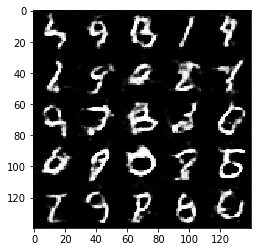

Epoch 1/2... Discriminator Loss: 0.8288... Generator Loss: 1.8800
Epoch 1/2... Discriminator Loss: 1.2862... Generator Loss: 2.5867
Epoch 1/2... Discriminator Loss: 0.8125... Generator Loss: 1.2671
Epoch 2/2... Discriminator Loss: 0.7846... Generator Loss: 1.7052
Epoch 2/2... Discriminator Loss: 0.9685... Generator Loss: 1.0789
Epoch 2/2... Discriminator Loss: 0.9445... Generator Loss: 0.9414
Epoch 2/2... Discriminator Loss: 0.7391... Generator Loss: 1.6901
Epoch 2/2... Discriminator Loss: 0.9405... Generator Loss: 1.0722
Epoch 2/2... Discriminator Loss: 0.8227... Generator Loss: 1.4834
Epoch 2/2... Discriminator Loss: 0.7696... Generator Loss: 1.6151


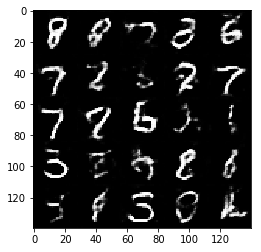

Epoch 2/2... Discriminator Loss: 0.8589... Generator Loss: 1.4344
Epoch 2/2... Discriminator Loss: 0.9807... Generator Loss: 0.8805
Epoch 2/2... Discriminator Loss: 0.7584... Generator Loss: 1.5451
Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 1.8430
Epoch 2/2... Discriminator Loss: 0.8753... Generator Loss: 1.0995
Epoch 2/2... Discriminator Loss: 0.8055... Generator Loss: 1.4443
Epoch 2/2... Discriminator Loss: 0.7805... Generator Loss: 1.3514
Epoch 2/2... Discriminator Loss: 1.0351... Generator Loss: 0.8361
Epoch 2/2... Discriminator Loss: 0.8607... Generator Loss: 1.5205
Epoch 2/2... Discriminator Loss: 0.9314... Generator Loss: 1.1153


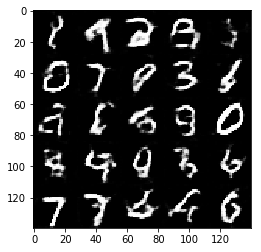

Epoch 2/2... Discriminator Loss: 1.1344... Generator Loss: 0.7194
Epoch 2/2... Discriminator Loss: 0.8308... Generator Loss: 1.2978
Epoch 2/2... Discriminator Loss: 0.7806... Generator Loss: 1.3603
Epoch 2/2... Discriminator Loss: 0.9411... Generator Loss: 0.9638
Epoch 2/2... Discriminator Loss: 1.1697... Generator Loss: 0.7045
Epoch 2/2... Discriminator Loss: 0.8111... Generator Loss: 1.5737
Epoch 2/2... Discriminator Loss: 0.8681... Generator Loss: 2.0057
Epoch 2/2... Discriminator Loss: 0.9296... Generator Loss: 0.9690
Epoch 2/2... Discriminator Loss: 0.8943... Generator Loss: 1.4769
Epoch 2/2... Discriminator Loss: 0.9644... Generator Loss: 0.9600


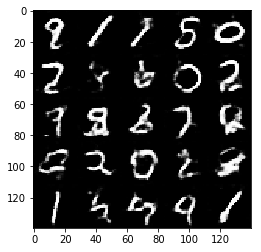

Epoch 2/2... Discriminator Loss: 0.7949... Generator Loss: 1.1690
Epoch 2/2... Discriminator Loss: 1.0068... Generator Loss: 0.8789
Epoch 2/2... Discriminator Loss: 0.7238... Generator Loss: 1.6305
Epoch 2/2... Discriminator Loss: 0.9564... Generator Loss: 0.9902
Epoch 2/2... Discriminator Loss: 0.7648... Generator Loss: 1.3936
Epoch 2/2... Discriminator Loss: 0.9066... Generator Loss: 1.0735
Epoch 2/2... Discriminator Loss: 0.8769... Generator Loss: 1.8182
Epoch 2/2... Discriminator Loss: 0.9523... Generator Loss: 0.8951
Epoch 2/2... Discriminator Loss: 0.6955... Generator Loss: 1.5681
Epoch 2/2... Discriminator Loss: 0.7703... Generator Loss: 1.3722


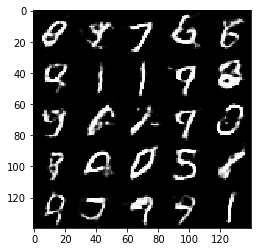

Epoch 2/2... Discriminator Loss: 1.1208... Generator Loss: 2.6628
Epoch 2/2... Discriminator Loss: 0.8219... Generator Loss: 1.3371
Epoch 2/2... Discriminator Loss: 0.7219... Generator Loss: 1.7911
Epoch 2/2... Discriminator Loss: 0.7579... Generator Loss: 1.5127
Epoch 2/2... Discriminator Loss: 0.7671... Generator Loss: 2.2110
Epoch 2/2... Discriminator Loss: 0.9219... Generator Loss: 0.9888
Epoch 2/2... Discriminator Loss: 0.7945... Generator Loss: 1.2895
Epoch 2/2... Discriminator Loss: 0.8750... Generator Loss: 0.9732
Epoch 2/2... Discriminator Loss: 0.8013... Generator Loss: 2.2783
Epoch 2/2... Discriminator Loss: 0.7836... Generator Loss: 1.8488


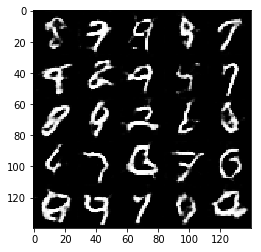

Epoch 2/2... Discriminator Loss: 0.7843... Generator Loss: 1.2516
Epoch 2/2... Discriminator Loss: 0.7321... Generator Loss: 1.8566
Epoch 2/2... Discriminator Loss: 0.7402... Generator Loss: 2.0247
Epoch 2/2... Discriminator Loss: 0.8834... Generator Loss: 1.0907
Epoch 2/2... Discriminator Loss: 0.8368... Generator Loss: 1.2180
Epoch 2/2... Discriminator Loss: 0.6987... Generator Loss: 2.1241
Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 0.9591
Epoch 2/2... Discriminator Loss: 0.6922... Generator Loss: 1.6280
Epoch 2/2... Discriminator Loss: 0.7473... Generator Loss: 2.3994
Epoch 2/2... Discriminator Loss: 0.6100... Generator Loss: 2.1322


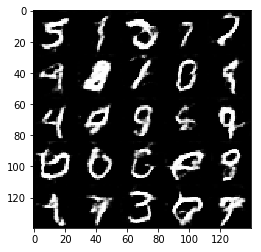

Epoch 2/2... Discriminator Loss: 0.7925... Generator Loss: 1.3483
Epoch 2/2... Discriminator Loss: 0.8504... Generator Loss: 2.1847
Epoch 2/2... Discriminator Loss: 0.7206... Generator Loss: 1.3537
Epoch 2/2... Discriminator Loss: 0.8999... Generator Loss: 2.5667
Epoch 2/2... Discriminator Loss: 0.8408... Generator Loss: 2.3297
Epoch 2/2... Discriminator Loss: 0.6773... Generator Loss: 1.8585
Epoch 2/2... Discriminator Loss: 0.6861... Generator Loss: 1.5281
Epoch 2/2... Discriminator Loss: 0.7702... Generator Loss: 1.3622
Epoch 2/2... Discriminator Loss: 1.7591... Generator Loss: 4.0170
Epoch 2/2... Discriminator Loss: 0.5553... Generator Loss: 2.1290


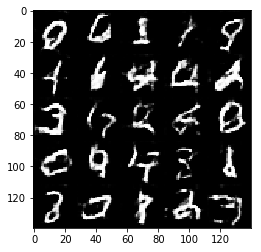

Epoch 2/2... Discriminator Loss: 0.6635... Generator Loss: 1.6432
Epoch 2/2... Discriminator Loss: 0.8986... Generator Loss: 1.1164
Epoch 2/2... Discriminator Loss: 0.6999... Generator Loss: 1.5231
Epoch 2/2... Discriminator Loss: 0.8998... Generator Loss: 1.0047
Epoch 2/2... Discriminator Loss: 0.9561... Generator Loss: 0.8957
Epoch 2/2... Discriminator Loss: 0.8120... Generator Loss: 1.3634
Epoch 2/2... Discriminator Loss: 0.8445... Generator Loss: 1.1064
Epoch 2/2... Discriminator Loss: 0.8694... Generator Loss: 1.0695
Epoch 2/2... Discriminator Loss: 0.6342... Generator Loss: 1.7871
Epoch 2/2... Discriminator Loss: 0.7358... Generator Loss: 1.3869


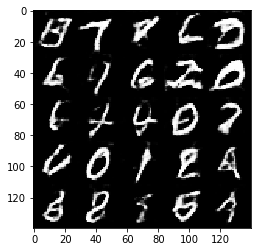

Epoch 2/2... Discriminator Loss: 0.7695... Generator Loss: 1.2825
Epoch 2/2... Discriminator Loss: 0.6169... Generator Loss: 1.9070
Epoch 2/2... Discriminator Loss: 0.7330... Generator Loss: 1.5822
Epoch 2/2... Discriminator Loss: 0.8017... Generator Loss: 2.4922
Epoch 2/2... Discriminator Loss: 0.7194... Generator Loss: 1.7334
Epoch 2/2... Discriminator Loss: 0.7979... Generator Loss: 1.4894
Epoch 2/2... Discriminator Loss: 0.9657... Generator Loss: 1.0316
Epoch 2/2... Discriminator Loss: 0.7696... Generator Loss: 1.2292
Epoch 2/2... Discriminator Loss: 0.7243... Generator Loss: 1.6875
Epoch 2/2... Discriminator Loss: 0.8460... Generator Loss: 1.0745


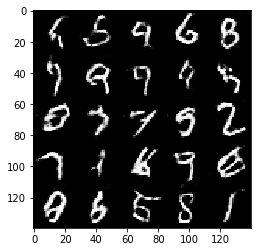

Epoch 2/2... Discriminator Loss: 0.9544... Generator Loss: 1.0367
Epoch 2/2... Discriminator Loss: 0.8082... Generator Loss: 1.2839
Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 1.3896
Epoch 2/2... Discriminator Loss: 0.6510... Generator Loss: 1.5491
Epoch 2/2... Discriminator Loss: 0.6294... Generator Loss: 2.1887
Epoch 2/2... Discriminator Loss: 0.7021... Generator Loss: 1.4594
Epoch 2/2... Discriminator Loss: 0.7272... Generator Loss: 1.3845


In [26]:
batch_size    = 64
z_dim         = 100
learning_rate = 0.0001
beta1         = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 0.8438... Generator Loss: 1.1486
Epoch 1/2... Discriminator Loss: 1.2056... Generator Loss: 0.7556
Epoch 1/2... Discriminator Loss: 0.7408... Generator Loss: 1.3501
Epoch 1/2... Discriminator Loss: 2.4633... Generator Loss: 0.1847
Epoch 1/2... Discriminator Loss: 0.8058... Generator Loss: 1.8348
Epoch 1/2... Discriminator Loss: 2.0028... Generator Loss: 0.2827
Epoch 1/2... Discriminator Loss: 1.0104... Generator Loss: 1.6526
Epoch 1/2... Discriminator Loss: 1.3100... Generator Loss: 1.2467
Epoch 1/2... Discriminator Loss: 1.1598... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.2782... Generator Loss: 0.6863


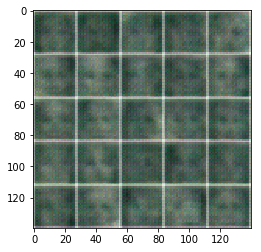

Epoch 1/2... Discriminator Loss: 1.1760... Generator Loss: 2.4237
Epoch 1/2... Discriminator Loss: 1.0763... Generator Loss: 1.2288
Epoch 1/2... Discriminator Loss: 1.6296... Generator Loss: 0.4281
Epoch 1/2... Discriminator Loss: 1.4763... Generator Loss: 0.5262
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 0.7257
Epoch 1/2... Discriminator Loss: 1.1381... Generator Loss: 1.0495
Epoch 1/2... Discriminator Loss: 1.4745... Generator Loss: 0.5884
Epoch 1/2... Discriminator Loss: 1.0848... Generator Loss: 0.9168
Epoch 1/2... Discriminator Loss: 0.9712... Generator Loss: 1.0616
Epoch 1/2... Discriminator Loss: 1.1356... Generator Loss: 0.8288


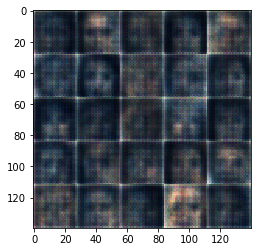

Epoch 1/2... Discriminator Loss: 1.3822... Generator Loss: 2.7338
Epoch 1/2... Discriminator Loss: 0.9691... Generator Loss: 1.0134
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.6289
Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 0.9785
Epoch 1/2... Discriminator Loss: 0.8938... Generator Loss: 1.6104
Epoch 1/2... Discriminator Loss: 1.0666... Generator Loss: 0.8372
Epoch 1/2... Discriminator Loss: 0.8748... Generator Loss: 1.4316
Epoch 1/2... Discriminator Loss: 1.2924... Generator Loss: 0.6154
Epoch 1/2... Discriminator Loss: 1.0173... Generator Loss: 1.1220
Epoch 1/2... Discriminator Loss: 1.4016... Generator Loss: 0.5773


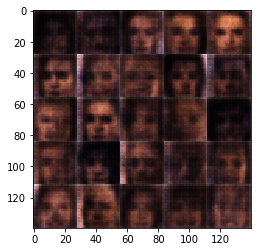

Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 1.1610
Epoch 1/2... Discriminator Loss: 1.0057... Generator Loss: 1.1112
Epoch 1/2... Discriminator Loss: 1.2547... Generator Loss: 0.9991
Epoch 1/2... Discriminator Loss: 0.9584... Generator Loss: 1.2168
Epoch 1/2... Discriminator Loss: 0.9606... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 1.4414... Generator Loss: 0.8460
Epoch 1/2... Discriminator Loss: 1.0676... Generator Loss: 1.2082
Epoch 1/2... Discriminator Loss: 1.1411... Generator Loss: 1.1043
Epoch 1/2... Discriminator Loss: 1.1469... Generator Loss: 1.0046
Epoch 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.7798


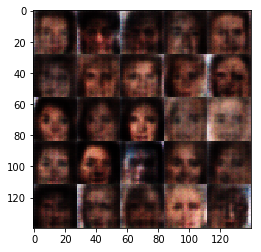

Epoch 1/2... Discriminator Loss: 1.1798... Generator Loss: 1.0836
Epoch 1/2... Discriminator Loss: 1.3120... Generator Loss: 0.6326
Epoch 1/2... Discriminator Loss: 1.1824... Generator Loss: 1.0653
Epoch 1/2... Discriminator Loss: 1.1018... Generator Loss: 0.9712
Epoch 1/2... Discriminator Loss: 1.3011... Generator Loss: 0.6880
Epoch 1/2... Discriminator Loss: 1.2162... Generator Loss: 0.8162
Epoch 1/2... Discriminator Loss: 1.1868... Generator Loss: 0.7561
Epoch 1/2... Discriminator Loss: 1.2794... Generator Loss: 0.6016
Epoch 1/2... Discriminator Loss: 1.0330... Generator Loss: 0.9569
Epoch 1/2... Discriminator Loss: 1.1935... Generator Loss: 0.7228


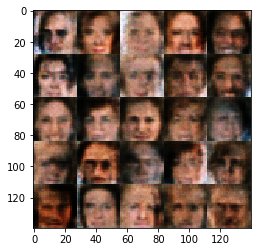

Epoch 1/2... Discriminator Loss: 1.3741... Generator Loss: 0.5818
Epoch 1/2... Discriminator Loss: 1.2408... Generator Loss: 0.7817
Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 0.7863
Epoch 1/2... Discriminator Loss: 1.2604... Generator Loss: 0.7295
Epoch 1/2... Discriminator Loss: 1.0631... Generator Loss: 0.9118
Epoch 1/2... Discriminator Loss: 1.2785... Generator Loss: 0.6901
Epoch 1/2... Discriminator Loss: 1.3006... Generator Loss: 0.7802
Epoch 1/2... Discriminator Loss: 1.2956... Generator Loss: 0.5751
Epoch 1/2... Discriminator Loss: 1.1085... Generator Loss: 1.0113
Epoch 1/2... Discriminator Loss: 1.3527... Generator Loss: 0.7091


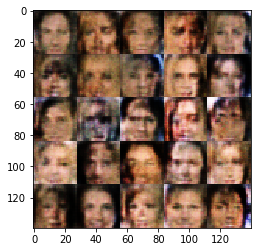

Epoch 1/2... Discriminator Loss: 1.2493... Generator Loss: 0.7957
Epoch 1/2... Discriminator Loss: 1.2463... Generator Loss: 1.2788
Epoch 1/2... Discriminator Loss: 1.1140... Generator Loss: 0.8967
Epoch 1/2... Discriminator Loss: 1.5491... Generator Loss: 0.4796
Epoch 1/2... Discriminator Loss: 1.2653... Generator Loss: 0.9544
Epoch 1/2... Discriminator Loss: 1.4137... Generator Loss: 0.6079
Epoch 1/2... Discriminator Loss: 1.0490... Generator Loss: 0.9606
Epoch 1/2... Discriminator Loss: 1.0870... Generator Loss: 1.0154
Epoch 1/2... Discriminator Loss: 1.2939... Generator Loss: 0.5944
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.9053


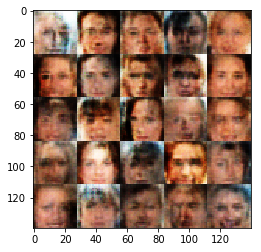

Epoch 1/2... Discriminator Loss: 0.9079... Generator Loss: 1.1168
Epoch 1/2... Discriminator Loss: 1.2939... Generator Loss: 0.7941
Epoch 1/2... Discriminator Loss: 1.2913... Generator Loss: 0.7154
Epoch 1/2... Discriminator Loss: 1.1225... Generator Loss: 0.8718
Epoch 1/2... Discriminator Loss: 0.9971... Generator Loss: 1.2678
Epoch 1/2... Discriminator Loss: 1.0871... Generator Loss: 1.0126
Epoch 1/2... Discriminator Loss: 1.4291... Generator Loss: 0.4896
Epoch 1/2... Discriminator Loss: 0.9920... Generator Loss: 1.1488
Epoch 1/2... Discriminator Loss: 1.0277... Generator Loss: 1.0724
Epoch 1/2... Discriminator Loss: 1.0719... Generator Loss: 0.8980


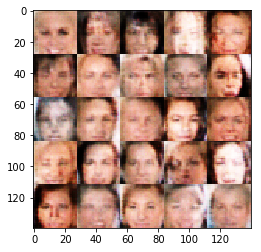

Epoch 1/2... Discriminator Loss: 1.1439... Generator Loss: 1.2127
Epoch 1/2... Discriminator Loss: 1.1447... Generator Loss: 0.9373
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 0.8189
Epoch 1/2... Discriminator Loss: 1.2876... Generator Loss: 0.6690
Epoch 1/2... Discriminator Loss: 1.1655... Generator Loss: 0.7689
Epoch 1/2... Discriminator Loss: 1.1931... Generator Loss: 0.9122
Epoch 1/2... Discriminator Loss: 1.2517... Generator Loss: 0.6869
Epoch 1/2... Discriminator Loss: 1.2165... Generator Loss: 0.7240
Epoch 1/2... Discriminator Loss: 1.0683... Generator Loss: 0.9119
Epoch 1/2... Discriminator Loss: 1.5212... Generator Loss: 0.4779


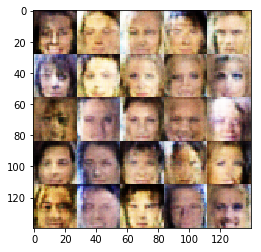

Epoch 1/2... Discriminator Loss: 1.1034... Generator Loss: 0.8651
Epoch 1/2... Discriminator Loss: 1.1693... Generator Loss: 0.7860
Epoch 1/2... Discriminator Loss: 1.1221... Generator Loss: 0.8594
Epoch 1/2... Discriminator Loss: 1.0143... Generator Loss: 1.1172
Epoch 1/2... Discriminator Loss: 1.2000... Generator Loss: 1.4072
Epoch 1/2... Discriminator Loss: 1.0918... Generator Loss: 0.9356
Epoch 1/2... Discriminator Loss: 0.9506... Generator Loss: 1.0207
Epoch 1/2... Discriminator Loss: 1.1839... Generator Loss: 0.8104
Epoch 1/2... Discriminator Loss: 1.1691... Generator Loss: 0.8071
Epoch 1/2... Discriminator Loss: 1.1088... Generator Loss: 1.3788


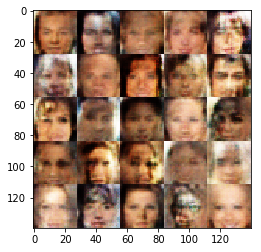

Epoch 1/2... Discriminator Loss: 1.3017... Generator Loss: 0.6573
Epoch 1/2... Discriminator Loss: 1.4198... Generator Loss: 0.4896
Epoch 1/2... Discriminator Loss: 1.1650... Generator Loss: 1.0404
Epoch 1/2... Discriminator Loss: 0.9183... Generator Loss: 1.3419
Epoch 1/2... Discriminator Loss: 1.0757... Generator Loss: 0.8685
Epoch 1/2... Discriminator Loss: 1.1036... Generator Loss: 0.7657
Epoch 1/2... Discriminator Loss: 0.9394... Generator Loss: 1.2768
Epoch 1/2... Discriminator Loss: 1.0117... Generator Loss: 0.9789
Epoch 1/2... Discriminator Loss: 0.9639... Generator Loss: 1.1460
Epoch 1/2... Discriminator Loss: 1.0790... Generator Loss: 0.9040


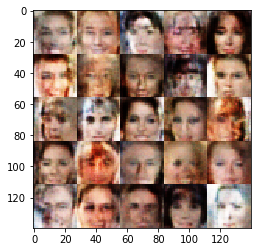

Epoch 1/2... Discriminator Loss: 0.9791... Generator Loss: 1.0132
Epoch 1/2... Discriminator Loss: 1.0022... Generator Loss: 1.0904
Epoch 1/2... Discriminator Loss: 1.0491... Generator Loss: 1.1430
Epoch 1/2... Discriminator Loss: 1.3058... Generator Loss: 0.6420
Epoch 1/2... Discriminator Loss: 1.1510... Generator Loss: 0.8723
Epoch 1/2... Discriminator Loss: 1.2221... Generator Loss: 0.9730
Epoch 1/2... Discriminator Loss: 1.1083... Generator Loss: 0.8074
Epoch 1/2... Discriminator Loss: 1.2357... Generator Loss: 0.6448
Epoch 1/2... Discriminator Loss: 1.2150... Generator Loss: 0.6978
Epoch 1/2... Discriminator Loss: 0.8747... Generator Loss: 1.2073


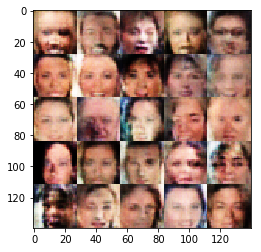

Epoch 1/2... Discriminator Loss: 1.0525... Generator Loss: 0.9856
Epoch 1/2... Discriminator Loss: 1.1024... Generator Loss: 0.9247
Epoch 1/2... Discriminator Loss: 1.1732... Generator Loss: 0.8530
Epoch 1/2... Discriminator Loss: 1.2831... Generator Loss: 0.8004
Epoch 1/2... Discriminator Loss: 1.0100... Generator Loss: 0.9078
Epoch 1/2... Discriminator Loss: 1.3226... Generator Loss: 0.6289
Epoch 1/2... Discriminator Loss: 1.1110... Generator Loss: 0.8393
Epoch 1/2... Discriminator Loss: 1.0852... Generator Loss: 1.1538
Epoch 1/2... Discriminator Loss: 0.9598... Generator Loss: 1.5598
Epoch 1/2... Discriminator Loss: 1.0939... Generator Loss: 0.9658


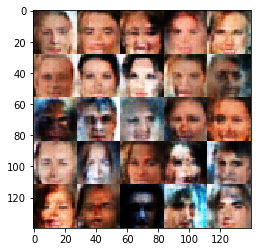

Epoch 1/2... Discriminator Loss: 1.2776... Generator Loss: 0.8028
Epoch 1/2... Discriminator Loss: 1.3618... Generator Loss: 0.8939
Epoch 1/2... Discriminator Loss: 1.3067... Generator Loss: 0.5885
Epoch 1/2... Discriminator Loss: 1.1497... Generator Loss: 0.8553
Epoch 1/2... Discriminator Loss: 1.0368... Generator Loss: 1.0405
Epoch 1/2... Discriminator Loss: 1.2741... Generator Loss: 0.6262
Epoch 1/2... Discriminator Loss: 0.9044... Generator Loss: 1.3203
Epoch 1/2... Discriminator Loss: 1.0095... Generator Loss: 1.5417
Epoch 1/2... Discriminator Loss: 1.3332... Generator Loss: 0.6353
Epoch 1/2... Discriminator Loss: 1.2149... Generator Loss: 1.5088


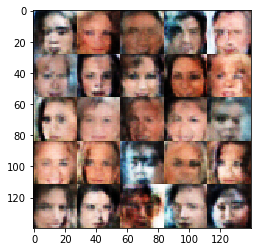

Epoch 1/2... Discriminator Loss: 1.1106... Generator Loss: 0.8232
Epoch 1/2... Discriminator Loss: 1.2458... Generator Loss: 0.9714
Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 0.7417
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 1.4713
Epoch 1/2... Discriminator Loss: 1.1682... Generator Loss: 0.7750
Epoch 1/2... Discriminator Loss: 1.1713... Generator Loss: 0.8313
Epoch 1/2... Discriminator Loss: 1.0497... Generator Loss: 0.8662
Epoch 1/2... Discriminator Loss: 1.2463... Generator Loss: 0.7413
Epoch 1/2... Discriminator Loss: 1.1964... Generator Loss: 0.6392
Epoch 1/2... Discriminator Loss: 1.2369... Generator Loss: 0.7486


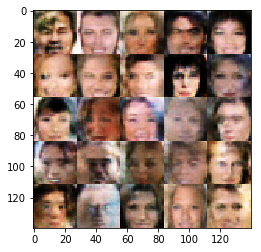

Epoch 1/2... Discriminator Loss: 1.2330... Generator Loss: 0.7385
Epoch 1/2... Discriminator Loss: 1.0682... Generator Loss: 1.0106
Epoch 1/2... Discriminator Loss: 1.0440... Generator Loss: 1.1428
Epoch 1/2... Discriminator Loss: 1.2211... Generator Loss: 0.7454
Epoch 1/2... Discriminator Loss: 1.4625... Generator Loss: 0.6556
Epoch 1/2... Discriminator Loss: 1.0915... Generator Loss: 0.8030
Epoch 1/2... Discriminator Loss: 0.9401... Generator Loss: 1.3025
Epoch 1/2... Discriminator Loss: 1.1657... Generator Loss: 1.0816
Epoch 1/2... Discriminator Loss: 1.2543... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 1.2146... Generator Loss: 1.0359


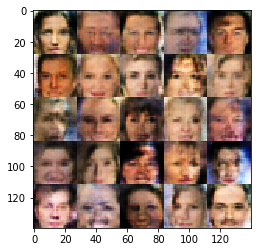

Epoch 1/2... Discriminator Loss: 1.0590... Generator Loss: 1.0349
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 0.8488
Epoch 1/2... Discriminator Loss: 0.9541... Generator Loss: 1.2411
Epoch 1/2... Discriminator Loss: 1.3208... Generator Loss: 0.5774
Epoch 1/2... Discriminator Loss: 1.2953... Generator Loss: 0.6008
Epoch 1/2... Discriminator Loss: 1.1480... Generator Loss: 0.7847
Epoch 1/2... Discriminator Loss: 1.1247... Generator Loss: 0.9325
Epoch 1/2... Discriminator Loss: 0.9977... Generator Loss: 1.2735
Epoch 1/2... Discriminator Loss: 1.2137... Generator Loss: 0.6986
Epoch 1/2... Discriminator Loss: 1.1283... Generator Loss: 1.1841


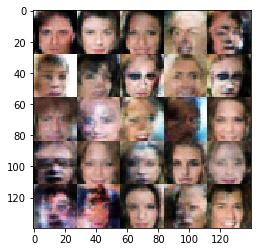

Epoch 1/2... Discriminator Loss: 1.0144... Generator Loss: 0.9804
Epoch 1/2... Discriminator Loss: 1.2694... Generator Loss: 0.6050
Epoch 1/2... Discriminator Loss: 1.2670... Generator Loss: 0.5717
Epoch 1/2... Discriminator Loss: 1.0559... Generator Loss: 0.9245
Epoch 1/2... Discriminator Loss: 1.4104... Generator Loss: 0.7792
Epoch 1/2... Discriminator Loss: 1.1513... Generator Loss: 1.2689
Epoch 1/2... Discriminator Loss: 1.1277... Generator Loss: 0.8050
Epoch 1/2... Discriminator Loss: 1.1003... Generator Loss: 0.8966
Epoch 1/2... Discriminator Loss: 1.1612... Generator Loss: 0.8431
Epoch 1/2... Discriminator Loss: 1.0371... Generator Loss: 0.9640


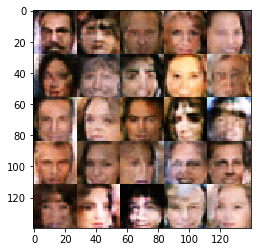

Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 1.0629
Epoch 1/2... Discriminator Loss: 1.2993... Generator Loss: 0.6630
Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 1.1606
Epoch 1/2... Discriminator Loss: 1.1341... Generator Loss: 0.9759
Epoch 1/2... Discriminator Loss: 1.0848... Generator Loss: 1.0240
Epoch 1/2... Discriminator Loss: 1.4202... Generator Loss: 0.4693
Epoch 1/2... Discriminator Loss: 1.1349... Generator Loss: 0.7377
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 0.9194
Epoch 1/2... Discriminator Loss: 1.2790... Generator Loss: 0.6002
Epoch 1/2... Discriminator Loss: 1.0872... Generator Loss: 0.8287


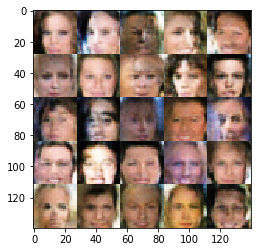

Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 0.9458
Epoch 1/2... Discriminator Loss: 1.2801... Generator Loss: 0.6366
Epoch 1/2... Discriminator Loss: 1.0537... Generator Loss: 1.2107
Epoch 1/2... Discriminator Loss: 1.2549... Generator Loss: 0.6972
Epoch 1/2... Discriminator Loss: 1.0547... Generator Loss: 0.9240
Epoch 1/2... Discriminator Loss: 1.1425... Generator Loss: 0.7414
Epoch 1/2... Discriminator Loss: 1.0724... Generator Loss: 0.9446
Epoch 1/2... Discriminator Loss: 1.3111... Generator Loss: 0.5885
Epoch 1/2... Discriminator Loss: 1.0567... Generator Loss: 0.9740
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.9659


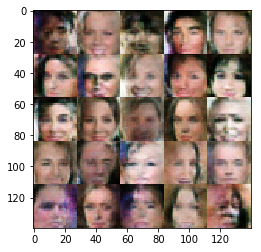

Epoch 1/2... Discriminator Loss: 1.1876... Generator Loss: 0.7174
Epoch 1/2... Discriminator Loss: 1.1068... Generator Loss: 0.8290
Epoch 1/2... Discriminator Loss: 1.1813... Generator Loss: 0.9060
Epoch 1/2... Discriminator Loss: 1.3137... Generator Loss: 0.6847
Epoch 1/2... Discriminator Loss: 1.0714... Generator Loss: 0.8808
Epoch 1/2... Discriminator Loss: 1.1192... Generator Loss: 0.9074
Epoch 1/2... Discriminator Loss: 1.1403... Generator Loss: 1.1621
Epoch 1/2... Discriminator Loss: 1.0663... Generator Loss: 0.9800
Epoch 1/2... Discriminator Loss: 1.1008... Generator Loss: 1.0596
Epoch 1/2... Discriminator Loss: 1.2317... Generator Loss: 0.7977


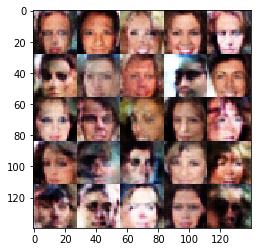

Epoch 1/2... Discriminator Loss: 1.3212... Generator Loss: 0.6896
Epoch 1/2... Discriminator Loss: 1.1530... Generator Loss: 0.7820
Epoch 1/2... Discriminator Loss: 1.3540... Generator Loss: 0.7238
Epoch 1/2... Discriminator Loss: 1.2539... Generator Loss: 0.6462
Epoch 1/2... Discriminator Loss: 1.1815... Generator Loss: 0.8319
Epoch 1/2... Discriminator Loss: 1.1722... Generator Loss: 0.7013
Epoch 1/2... Discriminator Loss: 1.0938... Generator Loss: 1.1909
Epoch 1/2... Discriminator Loss: 0.9613... Generator Loss: 1.2747
Epoch 1/2... Discriminator Loss: 1.2957... Generator Loss: 0.9459
Epoch 1/2... Discriminator Loss: 1.2476... Generator Loss: 0.8460


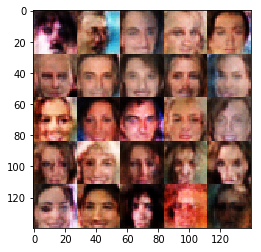

Epoch 1/2... Discriminator Loss: 1.3104... Generator Loss: 0.5835
Epoch 1/2... Discriminator Loss: 0.9881... Generator Loss: 0.9928
Epoch 1/2... Discriminator Loss: 1.2103... Generator Loss: 0.6519
Epoch 1/2... Discriminator Loss: 1.3951... Generator Loss: 0.6019
Epoch 1/2... Discriminator Loss: 1.1171... Generator Loss: 1.2979
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 0.8827
Epoch 1/2... Discriminator Loss: 1.3081... Generator Loss: 1.0292
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 0.9995
Epoch 1/2... Discriminator Loss: 1.3795... Generator Loss: 0.5800
Epoch 1/2... Discriminator Loss: 1.1278... Generator Loss: 0.8718


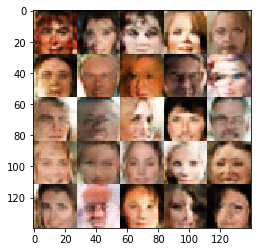

Epoch 1/2... Discriminator Loss: 1.0969... Generator Loss: 0.8472
Epoch 1/2... Discriminator Loss: 1.0257... Generator Loss: 1.0006
Epoch 1/2... Discriminator Loss: 1.0952... Generator Loss: 0.9710
Epoch 1/2... Discriminator Loss: 1.2614... Generator Loss: 0.6423
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 0.9948
Epoch 1/2... Discriminator Loss: 1.1260... Generator Loss: 1.0066
Epoch 1/2... Discriminator Loss: 1.3765... Generator Loss: 0.7026
Epoch 1/2... Discriminator Loss: 1.1285... Generator Loss: 0.8595
Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 0.8838
Epoch 1/2... Discriminator Loss: 1.1810... Generator Loss: 0.7143


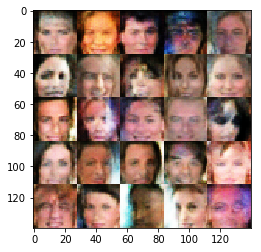

Epoch 1/2... Discriminator Loss: 1.3122... Generator Loss: 0.6183
Epoch 1/2... Discriminator Loss: 1.2572... Generator Loss: 0.6147
Epoch 1/2... Discriminator Loss: 1.1055... Generator Loss: 0.9566
Epoch 1/2... Discriminator Loss: 1.3338... Generator Loss: 0.5967
Epoch 1/2... Discriminator Loss: 0.9662... Generator Loss: 1.1869
Epoch 1/2... Discriminator Loss: 0.9750... Generator Loss: 0.9510
Epoch 1/2... Discriminator Loss: 1.1610... Generator Loss: 0.8823
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 0.9711
Epoch 1/2... Discriminator Loss: 1.1362... Generator Loss: 0.9886
Epoch 1/2... Discriminator Loss: 1.1099... Generator Loss: 1.2615


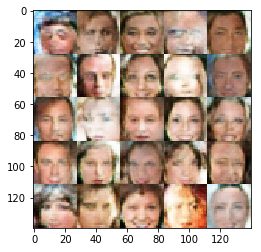

Epoch 1/2... Discriminator Loss: 1.1441... Generator Loss: 1.2746
Epoch 1/2... Discriminator Loss: 1.1516... Generator Loss: 0.7606
Epoch 1/2... Discriminator Loss: 0.9300... Generator Loss: 1.1464
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 0.7037
Epoch 1/2... Discriminator Loss: 1.1278... Generator Loss: 1.1489
Epoch 1/2... Discriminator Loss: 1.2276... Generator Loss: 0.7300
Epoch 1/2... Discriminator Loss: 1.1228... Generator Loss: 0.7014
Epoch 1/2... Discriminator Loss: 1.3341... Generator Loss: 0.7936
Epoch 1/2... Discriminator Loss: 1.2746... Generator Loss: 0.6251
Epoch 1/2... Discriminator Loss: 1.5278... Generator Loss: 0.4150


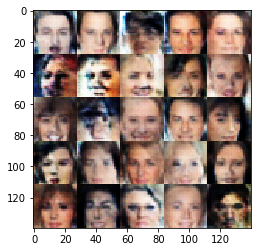

Epoch 1/2... Discriminator Loss: 1.1534... Generator Loss: 0.8074
Epoch 1/2... Discriminator Loss: 1.0706... Generator Loss: 1.1528
Epoch 1/2... Discriminator Loss: 1.1685... Generator Loss: 1.0040
Epoch 1/2... Discriminator Loss: 1.1984... Generator Loss: 0.6419
Epoch 1/2... Discriminator Loss: 1.4583... Generator Loss: 0.4986
Epoch 1/2... Discriminator Loss: 1.2157... Generator Loss: 0.7407
Epoch 1/2... Discriminator Loss: 0.9630... Generator Loss: 1.1739
Epoch 1/2... Discriminator Loss: 1.1534... Generator Loss: 0.8488
Epoch 1/2... Discriminator Loss: 1.1531... Generator Loss: 0.7574
Epoch 1/2... Discriminator Loss: 1.0215... Generator Loss: 0.8925


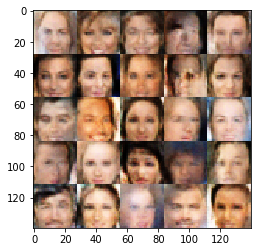

Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 0.5877
Epoch 1/2... Discriminator Loss: 1.4896... Generator Loss: 0.4620
Epoch 1/2... Discriminator Loss: 1.1117... Generator Loss: 0.9363
Epoch 1/2... Discriminator Loss: 1.3350... Generator Loss: 0.6374
Epoch 1/2... Discriminator Loss: 1.2613... Generator Loss: 0.7208
Epoch 1/2... Discriminator Loss: 1.1128... Generator Loss: 1.1438
Epoch 1/2... Discriminator Loss: 1.2443... Generator Loss: 0.7046
Epoch 1/2... Discriminator Loss: 1.0378... Generator Loss: 0.9025
Epoch 1/2... Discriminator Loss: 1.2136... Generator Loss: 0.7276
Epoch 1/2... Discriminator Loss: 1.2797... Generator Loss: 0.6368


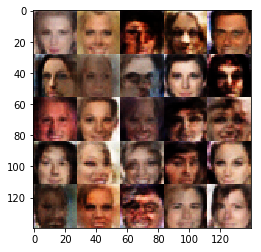

Epoch 1/2... Discriminator Loss: 1.3953... Generator Loss: 0.5066
Epoch 1/2... Discriminator Loss: 1.2061... Generator Loss: 0.7346
Epoch 1/2... Discriminator Loss: 0.9547... Generator Loss: 1.1098
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 0.8101
Epoch 1/2... Discriminator Loss: 1.3321... Generator Loss: 0.5944
Epoch 1/2... Discriminator Loss: 1.1332... Generator Loss: 0.8688
Epoch 1/2... Discriminator Loss: 1.0457... Generator Loss: 0.8685
Epoch 1/2... Discriminator Loss: 1.0772... Generator Loss: 0.9112
Epoch 1/2... Discriminator Loss: 1.0730... Generator Loss: 0.9869
Epoch 1/2... Discriminator Loss: 1.0427... Generator Loss: 0.9191


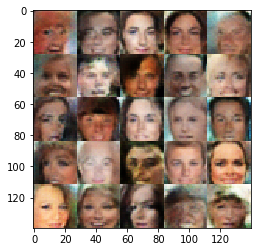

Epoch 1/2... Discriminator Loss: 1.3630... Generator Loss: 0.5397
Epoch 1/2... Discriminator Loss: 1.0311... Generator Loss: 1.0618
Epoch 1/2... Discriminator Loss: 1.1209... Generator Loss: 0.8332
Epoch 1/2... Discriminator Loss: 1.4819... Generator Loss: 0.4978
Epoch 1/2... Discriminator Loss: 1.3550... Generator Loss: 0.5593
Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.9114
Epoch 1/2... Discriminator Loss: 1.2202... Generator Loss: 0.7829
Epoch 1/2... Discriminator Loss: 1.0529... Generator Loss: 0.8963
Epoch 1/2... Discriminator Loss: 1.4954... Generator Loss: 0.4465
Epoch 1/2... Discriminator Loss: 1.1502... Generator Loss: 0.7449


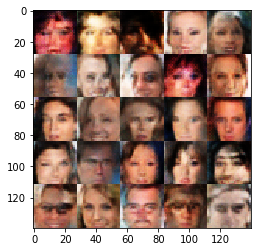

Epoch 1/2... Discriminator Loss: 1.2341... Generator Loss: 0.9579
Epoch 1/2... Discriminator Loss: 1.1840... Generator Loss: 0.9887
Epoch 1/2... Discriminator Loss: 1.2578... Generator Loss: 0.6473
Epoch 1/2... Discriminator Loss: 1.0954... Generator Loss: 1.1442
Epoch 1/2... Discriminator Loss: 1.0768... Generator Loss: 0.9034
Epoch 1/2... Discriminator Loss: 1.0720... Generator Loss: 1.0837
Epoch 1/2... Discriminator Loss: 1.0197... Generator Loss: 0.8693
Epoch 1/2... Discriminator Loss: 1.3282... Generator Loss: 0.6684
Epoch 1/2... Discriminator Loss: 1.2475... Generator Loss: 0.8006
Epoch 1/2... Discriminator Loss: 1.0951... Generator Loss: 0.8365


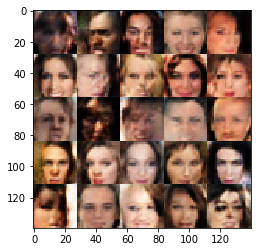

Epoch 1/2... Discriminator Loss: 1.2274... Generator Loss: 0.7762
Epoch 1/2... Discriminator Loss: 1.1774... Generator Loss: 0.8371
Epoch 1/2... Discriminator Loss: 1.3366... Generator Loss: 0.6039
Epoch 1/2... Discriminator Loss: 1.0739... Generator Loss: 0.9373
Epoch 1/2... Discriminator Loss: 1.1304... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 1.2412... Generator Loss: 0.7001
Epoch 1/2... Discriminator Loss: 1.1595... Generator Loss: 0.7733
Epoch 1/2... Discriminator Loss: 1.3557... Generator Loss: 0.8639
Epoch 1/2... Discriminator Loss: 0.9443... Generator Loss: 1.1182
Epoch 1/2... Discriminator Loss: 1.1571... Generator Loss: 1.0155


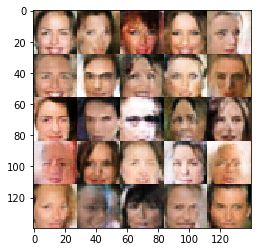

Epoch 1/2... Discriminator Loss: 1.0924... Generator Loss: 0.8371
Epoch 1/2... Discriminator Loss: 0.9563... Generator Loss: 1.0395
Epoch 1/2... Discriminator Loss: 0.9627... Generator Loss: 1.2646
Epoch 1/2... Discriminator Loss: 0.9870... Generator Loss: 1.0884
Epoch 1/2... Discriminator Loss: 1.0767... Generator Loss: 0.9024
Epoch 1/2... Discriminator Loss: 1.0657... Generator Loss: 0.8729
Epoch 1/2... Discriminator Loss: 1.2889... Generator Loss: 0.6618
Epoch 1/2... Discriminator Loss: 0.9016... Generator Loss: 1.2179
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.7888
Epoch 1/2... Discriminator Loss: 1.3435... Generator Loss: 0.5243


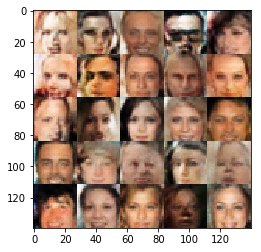

Epoch 1/2... Discriminator Loss: 1.3045... Generator Loss: 0.6856
Epoch 1/2... Discriminator Loss: 1.0759... Generator Loss: 0.8462
Epoch 1/2... Discriminator Loss: 1.2201... Generator Loss: 0.6353
Epoch 1/2... Discriminator Loss: 1.5034... Generator Loss: 0.4757
Epoch 1/2... Discriminator Loss: 1.4943... Generator Loss: 0.4971
Epoch 1/2... Discriminator Loss: 1.2571... Generator Loss: 0.6701
Epoch 1/2... Discriminator Loss: 1.1781... Generator Loss: 0.6797
Epoch 1/2... Discriminator Loss: 1.3275... Generator Loss: 0.6647
Epoch 1/2... Discriminator Loss: 1.1980... Generator Loss: 0.6486
Epoch 1/2... Discriminator Loss: 1.1595... Generator Loss: 0.8747


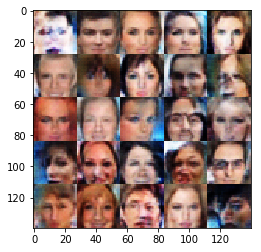

Epoch 1/2... Discriminator Loss: 1.3538... Generator Loss: 0.7382
Epoch 1/2... Discriminator Loss: 1.1683... Generator Loss: 0.9325
Epoch 1/2... Discriminator Loss: 1.2000... Generator Loss: 0.7468
Epoch 1/2... Discriminator Loss: 1.1262... Generator Loss: 0.9044
Epoch 1/2... Discriminator Loss: 1.2136... Generator Loss: 0.7537
Epoch 1/2... Discriminator Loss: 1.1319... Generator Loss: 0.9253
Epoch 1/2... Discriminator Loss: 1.2185... Generator Loss: 0.8555
Epoch 1/2... Discriminator Loss: 1.0546... Generator Loss: 0.8474
Epoch 1/2... Discriminator Loss: 1.0763... Generator Loss: 1.1151
Epoch 1/2... Discriminator Loss: 1.5620... Generator Loss: 0.4758


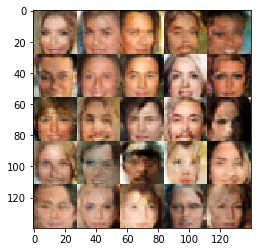

Epoch 1/2... Discriminator Loss: 1.3159... Generator Loss: 0.5554
Epoch 1/2... Discriminator Loss: 1.2390... Generator Loss: 0.8297
Epoch 1/2... Discriminator Loss: 1.1757... Generator Loss: 0.7260
Epoch 1/2... Discriminator Loss: 1.1663... Generator Loss: 1.0242
Epoch 1/2... Discriminator Loss: 0.9478... Generator Loss: 1.0122
Epoch 1/2... Discriminator Loss: 1.1085... Generator Loss: 0.7739
Epoch 1/2... Discriminator Loss: 1.1279... Generator Loss: 0.8868
Epoch 1/2... Discriminator Loss: 1.1235... Generator Loss: 0.8495
Epoch 1/2... Discriminator Loss: 1.2853... Generator Loss: 0.7452
Epoch 1/2... Discriminator Loss: 1.4951... Generator Loss: 0.5923


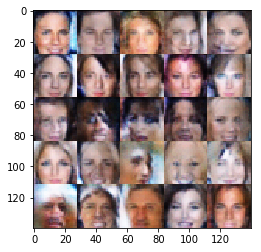

Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.6959
Epoch 1/2... Discriminator Loss: 1.0401... Generator Loss: 0.8832
Epoch 1/2... Discriminator Loss: 1.2528... Generator Loss: 0.7858
Epoch 1/2... Discriminator Loss: 1.1597... Generator Loss: 0.7876
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.6559
Epoch 1/2... Discriminator Loss: 1.0986... Generator Loss: 0.8387
Epoch 1/2... Discriminator Loss: 1.1103... Generator Loss: 1.0870
Epoch 1/2... Discriminator Loss: 1.3753... Generator Loss: 0.5312
Epoch 1/2... Discriminator Loss: 1.3040... Generator Loss: 0.6259
Epoch 1/2... Discriminator Loss: 1.1203... Generator Loss: 0.8683


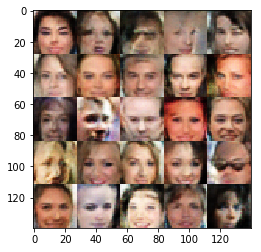

Epoch 1/2... Discriminator Loss: 1.0919... Generator Loss: 1.1981
Epoch 1/2... Discriminator Loss: 1.2408... Generator Loss: 0.6774
Epoch 1/2... Discriminator Loss: 1.3573... Generator Loss: 0.6147
Epoch 1/2... Discriminator Loss: 1.2301... Generator Loss: 0.7364
Epoch 1/2... Discriminator Loss: 1.2499... Generator Loss: 0.8164
Epoch 1/2... Discriminator Loss: 1.0059... Generator Loss: 1.2776
Epoch 1/2... Discriminator Loss: 1.3592... Generator Loss: 0.6225
Epoch 1/2... Discriminator Loss: 1.1067... Generator Loss: 1.0379
Epoch 1/2... Discriminator Loss: 1.1973... Generator Loss: 0.7175
Epoch 1/2... Discriminator Loss: 1.3537... Generator Loss: 0.6083


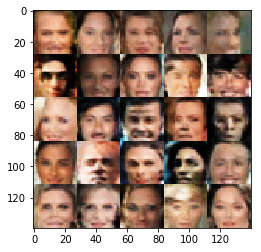

Epoch 1/2... Discriminator Loss: 1.1604... Generator Loss: 0.8805
Epoch 1/2... Discriminator Loss: 0.9388... Generator Loss: 1.0980
Epoch 1/2... Discriminator Loss: 1.0926... Generator Loss: 1.0240
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 0.7462
Epoch 1/2... Discriminator Loss: 1.1084... Generator Loss: 0.8507
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 0.6913
Epoch 1/2... Discriminator Loss: 1.1396... Generator Loss: 0.7610
Epoch 1/2... Discriminator Loss: 1.3647... Generator Loss: 0.6067
Epoch 1/2... Discriminator Loss: 1.1953... Generator Loss: 0.6617
Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 0.6403


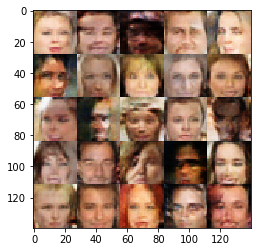

Epoch 1/2... Discriminator Loss: 1.1592... Generator Loss: 0.8724
Epoch 1/2... Discriminator Loss: 1.2659... Generator Loss: 0.8199
Epoch 1/2... Discriminator Loss: 1.3659... Generator Loss: 0.6732
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 1.3630... Generator Loss: 0.7502
Epoch 1/2... Discriminator Loss: 1.0996... Generator Loss: 1.1375
Epoch 1/2... Discriminator Loss: 1.2294... Generator Loss: 0.6508
Epoch 1/2... Discriminator Loss: 1.0879... Generator Loss: 1.2399
Epoch 1/2... Discriminator Loss: 1.2211... Generator Loss: 0.8669
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 0.7733


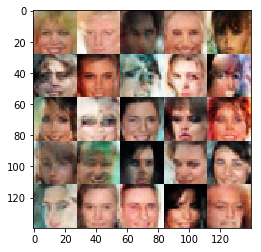

Epoch 1/2... Discriminator Loss: 1.0126... Generator Loss: 0.9958
Epoch 1/2... Discriminator Loss: 1.2999... Generator Loss: 0.9160
Epoch 1/2... Discriminator Loss: 1.2670... Generator Loss: 0.8849
Epoch 1/2... Discriminator Loss: 1.3607... Generator Loss: 0.6707
Epoch 1/2... Discriminator Loss: 1.1232... Generator Loss: 0.8524
Epoch 1/2... Discriminator Loss: 1.3011... Generator Loss: 0.6285
Epoch 1/2... Discriminator Loss: 1.1420... Generator Loss: 1.0289
Epoch 1/2... Discriminator Loss: 1.4296... Generator Loss: 0.7482
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.7503
Epoch 1/2... Discriminator Loss: 1.1840... Generator Loss: 0.8382


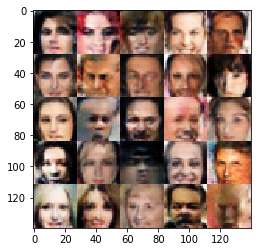

Epoch 1/2... Discriminator Loss: 1.1381... Generator Loss: 1.0661
Epoch 1/2... Discriminator Loss: 1.1543... Generator Loss: 0.7437
Epoch 1/2... Discriminator Loss: 1.1598... Generator Loss: 0.8186
Epoch 1/2... Discriminator Loss: 1.1720... Generator Loss: 0.7273
Epoch 1/2... Discriminator Loss: 1.3070... Generator Loss: 0.6085
Epoch 1/2... Discriminator Loss: 1.3956... Generator Loss: 0.6685
Epoch 1/2... Discriminator Loss: 1.1777... Generator Loss: 0.9144
Epoch 1/2... Discriminator Loss: 1.2492... Generator Loss: 0.7991
Epoch 1/2... Discriminator Loss: 1.1892... Generator Loss: 0.9078
Epoch 1/2... Discriminator Loss: 1.0879... Generator Loss: 0.8607


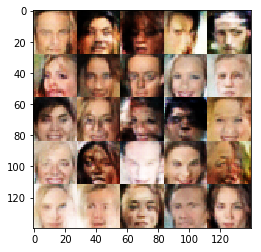

Epoch 1/2... Discriminator Loss: 1.4192... Generator Loss: 0.6129
Epoch 1/2... Discriminator Loss: 1.2000... Generator Loss: 0.9332
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 0.6705
Epoch 1/2... Discriminator Loss: 1.2879... Generator Loss: 0.8852
Epoch 1/2... Discriminator Loss: 1.2107... Generator Loss: 0.9721
Epoch 1/2... Discriminator Loss: 1.1266... Generator Loss: 0.8603
Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 0.7831
Epoch 1/2... Discriminator Loss: 1.3022... Generator Loss: 0.6607
Epoch 1/2... Discriminator Loss: 1.3996... Generator Loss: 0.6816
Epoch 1/2... Discriminator Loss: 1.2138... Generator Loss: 0.8014


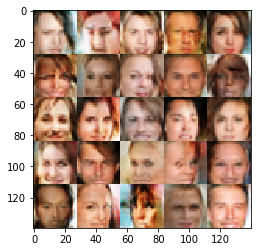

Epoch 1/2... Discriminator Loss: 1.2415... Generator Loss: 0.7087
Epoch 1/2... Discriminator Loss: 1.2041... Generator Loss: 0.7845
Epoch 1/2... Discriminator Loss: 1.2195... Generator Loss: 0.7921
Epoch 1/2... Discriminator Loss: 1.0255... Generator Loss: 0.9818
Epoch 1/2... Discriminator Loss: 1.1403... Generator Loss: 0.8795
Epoch 1/2... Discriminator Loss: 1.2119... Generator Loss: 1.0120
Epoch 1/2... Discriminator Loss: 1.0490... Generator Loss: 0.9330
Epoch 1/2... Discriminator Loss: 1.0517... Generator Loss: 0.8407
Epoch 1/2... Discriminator Loss: 1.1869... Generator Loss: 0.8541
Epoch 1/2... Discriminator Loss: 0.9970... Generator Loss: 1.1832


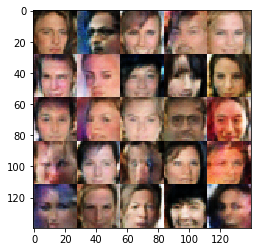

Epoch 1/2... Discriminator Loss: 1.2913... Generator Loss: 0.6966
Epoch 1/2... Discriminator Loss: 1.2600... Generator Loss: 0.6658
Epoch 1/2... Discriminator Loss: 1.2361... Generator Loss: 0.6271
Epoch 1/2... Discriminator Loss: 1.1700... Generator Loss: 0.8142
Epoch 1/2... Discriminator Loss: 1.0449... Generator Loss: 0.9783
Epoch 1/2... Discriminator Loss: 1.1336... Generator Loss: 0.9462
Epoch 1/2... Discriminator Loss: 1.3303... Generator Loss: 0.6067
Epoch 1/2... Discriminator Loss: 1.2864... Generator Loss: 0.6651
Epoch 1/2... Discriminator Loss: 1.1875... Generator Loss: 0.7606
Epoch 1/2... Discriminator Loss: 1.2803... Generator Loss: 0.6967


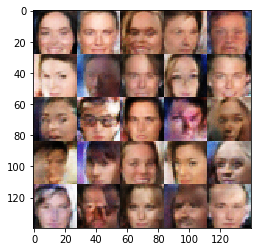

Epoch 1/2... Discriminator Loss: 1.3564... Generator Loss: 0.7191
Epoch 1/2... Discriminator Loss: 1.2065... Generator Loss: 0.6839
Epoch 1/2... Discriminator Loss: 1.1702... Generator Loss: 0.7412
Epoch 1/2... Discriminator Loss: 1.3134... Generator Loss: 0.6299
Epoch 1/2... Discriminator Loss: 1.3473... Generator Loss: 0.7600
Epoch 1/2... Discriminator Loss: 1.1831... Generator Loss: 0.9138
Epoch 1/2... Discriminator Loss: 1.4043... Generator Loss: 0.5600
Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 0.6800
Epoch 1/2... Discriminator Loss: 1.3637... Generator Loss: 0.5607
Epoch 1/2... Discriminator Loss: 1.2220... Generator Loss: 0.8639


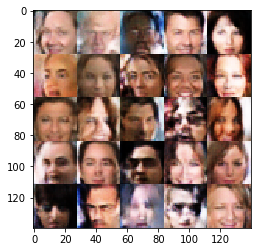

Epoch 1/2... Discriminator Loss: 1.0793... Generator Loss: 0.8669
Epoch 1/2... Discriminator Loss: 1.3238... Generator Loss: 0.5836
Epoch 1/2... Discriminator Loss: 1.1159... Generator Loss: 0.8189
Epoch 1/2... Discriminator Loss: 1.2433... Generator Loss: 0.8076
Epoch 1/2... Discriminator Loss: 1.0174... Generator Loss: 1.0296
Epoch 1/2... Discriminator Loss: 1.0671... Generator Loss: 1.0138
Epoch 1/2... Discriminator Loss: 1.1404... Generator Loss: 0.8672
Epoch 1/2... Discriminator Loss: 1.4241... Generator Loss: 0.5402
Epoch 1/2... Discriminator Loss: 1.3174... Generator Loss: 0.7986
Epoch 1/2... Discriminator Loss: 1.2611... Generator Loss: 0.7875


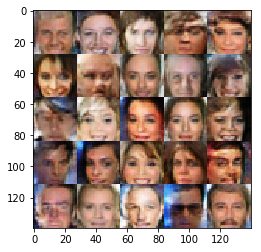

Epoch 1/2... Discriminator Loss: 1.1805... Generator Loss: 1.1844
Epoch 1/2... Discriminator Loss: 1.2124... Generator Loss: 0.7134
Epoch 1/2... Discriminator Loss: 1.4136... Generator Loss: 0.5320
Epoch 1/2... Discriminator Loss: 1.1013... Generator Loss: 1.0231
Epoch 1/2... Discriminator Loss: 1.2720... Generator Loss: 0.7982
Epoch 1/2... Discriminator Loss: 1.2383... Generator Loss: 0.7491
Epoch 1/2... Discriminator Loss: 1.0962... Generator Loss: 0.7925
Epoch 1/2... Discriminator Loss: 1.1178... Generator Loss: 1.0659
Epoch 1/2... Discriminator Loss: 1.3174... Generator Loss: 0.8093
Epoch 1/2... Discriminator Loss: 1.1611... Generator Loss: 0.9525


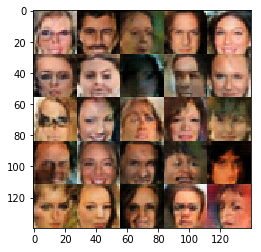

Epoch 1/2... Discriminator Loss: 1.1746... Generator Loss: 0.8845
Epoch 1/2... Discriminator Loss: 1.3462... Generator Loss: 0.6694
Epoch 1/2... Discriminator Loss: 1.2494... Generator Loss: 0.7287
Epoch 1/2... Discriminator Loss: 1.0748... Generator Loss: 1.0674
Epoch 1/2... Discriminator Loss: 1.2694... Generator Loss: 0.6176
Epoch 1/2... Discriminator Loss: 1.1405... Generator Loss: 1.0983
Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.8581
Epoch 1/2... Discriminator Loss: 1.5130... Generator Loss: 0.5486
Epoch 1/2... Discriminator Loss: 1.1003... Generator Loss: 0.8868
Epoch 1/2... Discriminator Loss: 1.1056... Generator Loss: 0.9735


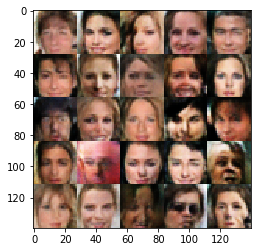

Epoch 1/2... Discriminator Loss: 1.2847... Generator Loss: 0.7778
Epoch 1/2... Discriminator Loss: 1.3079... Generator Loss: 0.7489
Epoch 1/2... Discriminator Loss: 1.0553... Generator Loss: 1.0392
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.8302
Epoch 1/2... Discriminator Loss: 1.3213... Generator Loss: 0.8009
Epoch 1/2... Discriminator Loss: 1.2501... Generator Loss: 0.8119
Epoch 1/2... Discriminator Loss: 1.1480... Generator Loss: 0.8739
Epoch 1/2... Discriminator Loss: 1.1217... Generator Loss: 0.8718
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 1.1508
Epoch 1/2... Discriminator Loss: 1.4026... Generator Loss: 0.6039


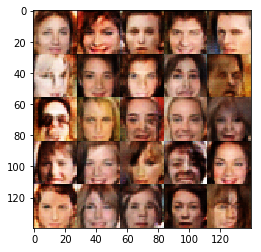

Epoch 1/2... Discriminator Loss: 1.2979... Generator Loss: 0.7299
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.6976
Epoch 1/2... Discriminator Loss: 1.2468... Generator Loss: 0.7161
Epoch 1/2... Discriminator Loss: 1.2828... Generator Loss: 0.5935
Epoch 1/2... Discriminator Loss: 1.2286... Generator Loss: 0.7391
Epoch 1/2... Discriminator Loss: 1.4370... Generator Loss: 0.5226
Epoch 1/2... Discriminator Loss: 1.2742... Generator Loss: 0.7220
Epoch 1/2... Discriminator Loss: 1.4411... Generator Loss: 0.6497
Epoch 1/2... Discriminator Loss: 1.3312... Generator Loss: 0.7506
Epoch 1/2... Discriminator Loss: 1.2725... Generator Loss: 0.7033


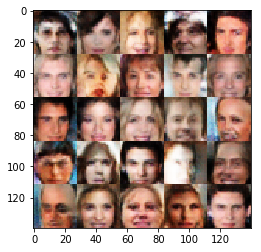

Epoch 1/2... Discriminator Loss: 0.9543... Generator Loss: 1.0030
Epoch 1/2... Discriminator Loss: 1.2142... Generator Loss: 0.7541
Epoch 1/2... Discriminator Loss: 1.0809... Generator Loss: 0.9094
Epoch 1/2... Discriminator Loss: 1.2580... Generator Loss: 0.7665
Epoch 1/2... Discriminator Loss: 1.2521... Generator Loss: 0.7060
Epoch 1/2... Discriminator Loss: 1.2467... Generator Loss: 0.9843
Epoch 1/2... Discriminator Loss: 1.1918... Generator Loss: 0.8426
Epoch 1/2... Discriminator Loss: 1.2169... Generator Loss: 0.7392
Epoch 1/2... Discriminator Loss: 1.2192... Generator Loss: 0.8814
Epoch 1/2... Discriminator Loss: 1.3356... Generator Loss: 0.6213


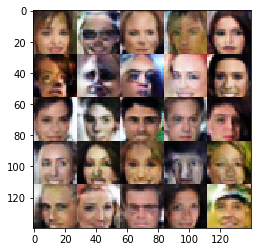

Epoch 1/2... Discriminator Loss: 1.0976... Generator Loss: 1.0145
Epoch 1/2... Discriminator Loss: 1.1531... Generator Loss: 0.8056
Epoch 1/2... Discriminator Loss: 1.0237... Generator Loss: 1.0107
Epoch 1/2... Discriminator Loss: 1.0843... Generator Loss: 0.9038
Epoch 1/2... Discriminator Loss: 1.2743... Generator Loss: 0.7316
Epoch 1/2... Discriminator Loss: 1.2864... Generator Loss: 0.8003
Epoch 1/2... Discriminator Loss: 1.2188... Generator Loss: 0.6802
Epoch 1/2... Discriminator Loss: 1.3228... Generator Loss: 0.8657
Epoch 1/2... Discriminator Loss: 1.1686... Generator Loss: 0.7420
Epoch 1/2... Discriminator Loss: 1.4192... Generator Loss: 0.5878


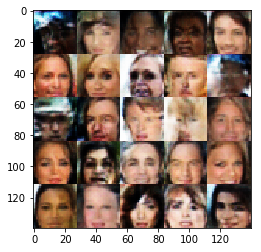

Epoch 1/2... Discriminator Loss: 1.2232... Generator Loss: 0.7772
Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 1.0780
Epoch 1/2... Discriminator Loss: 1.4155... Generator Loss: 0.6304
Epoch 1/2... Discriminator Loss: 1.3324... Generator Loss: 0.7319
Epoch 1/2... Discriminator Loss: 1.5352... Generator Loss: 0.4860
Epoch 1/2... Discriminator Loss: 1.4057... Generator Loss: 0.5863
Epoch 1/2... Discriminator Loss: 0.9639... Generator Loss: 1.3176
Epoch 1/2... Discriminator Loss: 1.2666... Generator Loss: 0.6290
Epoch 1/2... Discriminator Loss: 1.6591... Generator Loss: 0.6399
Epoch 1/2... Discriminator Loss: 1.2065... Generator Loss: 0.8938


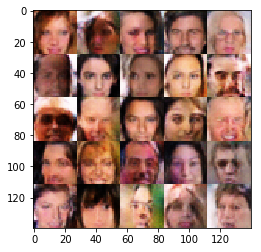

Epoch 1/2... Discriminator Loss: 1.2010... Generator Loss: 0.7523
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 0.8395
Epoch 1/2... Discriminator Loss: 1.2738... Generator Loss: 0.6306
Epoch 1/2... Discriminator Loss: 1.1805... Generator Loss: 0.8600
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 0.8456
Epoch 1/2... Discriminator Loss: 1.1949... Generator Loss: 0.7746
Epoch 1/2... Discriminator Loss: 1.1366... Generator Loss: 0.9256
Epoch 1/2... Discriminator Loss: 1.3494... Generator Loss: 0.8110
Epoch 1/2... Discriminator Loss: 1.4244... Generator Loss: 0.5617
Epoch 1/2... Discriminator Loss: 1.2098... Generator Loss: 0.7025


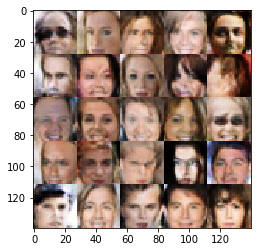

Epoch 1/2... Discriminator Loss: 1.1113... Generator Loss: 0.9396
Epoch 1/2... Discriminator Loss: 1.2735... Generator Loss: 0.8014
Epoch 1/2... Discriminator Loss: 1.0578... Generator Loss: 1.0678
Epoch 1/2... Discriminator Loss: 1.1920... Generator Loss: 0.8554
Epoch 1/2... Discriminator Loss: 1.1955... Generator Loss: 0.8258
Epoch 1/2... Discriminator Loss: 1.1263... Generator Loss: 0.9854
Epoch 1/2... Discriminator Loss: 1.1614... Generator Loss: 0.7400
Epoch 1/2... Discriminator Loss: 1.1998... Generator Loss: 0.8915
Epoch 1/2... Discriminator Loss: 1.1776... Generator Loss: 0.8475
Epoch 1/2... Discriminator Loss: 1.3883... Generator Loss: 0.7808


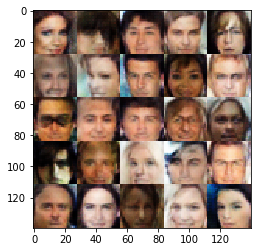

Epoch 1/2... Discriminator Loss: 1.2261... Generator Loss: 0.8636
Epoch 1/2... Discriminator Loss: 1.3229... Generator Loss: 0.6359
Epoch 1/2... Discriminator Loss: 1.0993... Generator Loss: 0.8423
Epoch 1/2... Discriminator Loss: 1.1348... Generator Loss: 0.8025
Epoch 1/2... Discriminator Loss: 1.2211... Generator Loss: 0.7768
Epoch 1/2... Discriminator Loss: 1.3589... Generator Loss: 0.6354
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 0.8667
Epoch 1/2... Discriminator Loss: 1.0257... Generator Loss: 1.2132
Epoch 1/2... Discriminator Loss: 1.1887... Generator Loss: 0.7671
Epoch 1/2... Discriminator Loss: 1.0832... Generator Loss: 0.9372


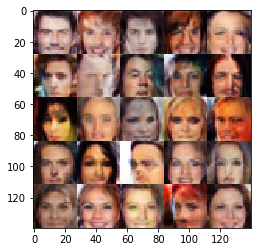

Epoch 1/2... Discriminator Loss: 1.3572... Generator Loss: 0.5983
Epoch 1/2... Discriminator Loss: 1.1960... Generator Loss: 0.7480
Epoch 1/2... Discriminator Loss: 1.1104... Generator Loss: 0.8568
Epoch 1/2... Discriminator Loss: 1.0804... Generator Loss: 0.8796
Epoch 1/2... Discriminator Loss: 1.4091... Generator Loss: 0.5691
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 0.8046
Epoch 1/2... Discriminator Loss: 1.3541... Generator Loss: 0.7630
Epoch 1/2... Discriminator Loss: 1.2080... Generator Loss: 0.9738
Epoch 1/2... Discriminator Loss: 1.4885... Generator Loss: 0.4528
Epoch 1/2... Discriminator Loss: 1.8177... Generator Loss: 0.3913


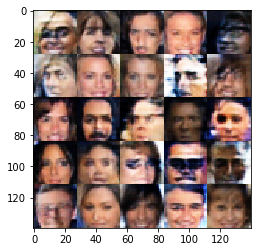

Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 0.9090
Epoch 1/2... Discriminator Loss: 1.1854... Generator Loss: 0.7345
Epoch 1/2... Discriminator Loss: 1.3037... Generator Loss: 0.7275
Epoch 1/2... Discriminator Loss: 1.4646... Generator Loss: 0.5440
Epoch 1/2... Discriminator Loss: 1.2587... Generator Loss: 0.7509
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 0.6917
Epoch 1/2... Discriminator Loss: 1.2575... Generator Loss: 0.8541
Epoch 1/2... Discriminator Loss: 1.2169... Generator Loss: 0.8203
Epoch 1/2... Discriminator Loss: 1.4198... Generator Loss: 0.6525
Epoch 1/2... Discriminator Loss: 1.5362... Generator Loss: 0.5647


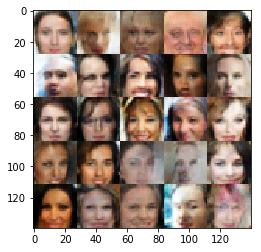

Epoch 1/2... Discriminator Loss: 1.2359... Generator Loss: 0.7934
Epoch 1/2... Discriminator Loss: 1.1078... Generator Loss: 0.9380
Epoch 1/2... Discriminator Loss: 1.3355... Generator Loss: 0.5710
Epoch 1/2... Discriminator Loss: 1.3238... Generator Loss: 0.6205
Epoch 1/2... Discriminator Loss: 1.3733... Generator Loss: 0.6595
Epoch 1/2... Discriminator Loss: 1.2727... Generator Loss: 0.6640
Epoch 1/2... Discriminator Loss: 1.1632... Generator Loss: 0.7549
Epoch 1/2... Discriminator Loss: 1.3263... Generator Loss: 0.6382
Epoch 1/2... Discriminator Loss: 1.0804... Generator Loss: 0.8967
Epoch 1/2... Discriminator Loss: 1.3012... Generator Loss: 0.6701


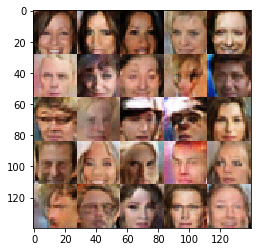

Epoch 1/2... Discriminator Loss: 1.1600... Generator Loss: 0.7678
Epoch 1/2... Discriminator Loss: 1.2341... Generator Loss: 0.6817
Epoch 1/2... Discriminator Loss: 1.2774... Generator Loss: 0.6859
Epoch 1/2... Discriminator Loss: 1.1414... Generator Loss: 1.2141
Epoch 1/2... Discriminator Loss: 1.5120... Generator Loss: 0.5048
Epoch 1/2... Discriminator Loss: 1.3210... Generator Loss: 0.7187
Epoch 1/2... Discriminator Loss: 1.2702... Generator Loss: 0.6708
Epoch 1/2... Discriminator Loss: 1.3705... Generator Loss: 0.7214
Epoch 1/2... Discriminator Loss: 1.3946... Generator Loss: 0.6390
Epoch 1/2... Discriminator Loss: 1.1160... Generator Loss: 0.9383


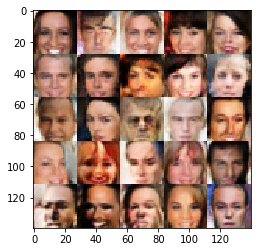

Epoch 1/2... Discriminator Loss: 1.1560... Generator Loss: 0.8045
Epoch 1/2... Discriminator Loss: 1.2907... Generator Loss: 0.7774
Epoch 1/2... Discriminator Loss: 1.3140... Generator Loss: 0.6357
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 0.9537
Epoch 1/2... Discriminator Loss: 1.0143... Generator Loss: 0.8672
Epoch 1/2... Discriminator Loss: 1.3118... Generator Loss: 0.6879
Epoch 1/2... Discriminator Loss: 1.3407... Generator Loss: 0.6073
Epoch 1/2... Discriminator Loss: 1.2937... Generator Loss: 0.7044
Epoch 1/2... Discriminator Loss: 1.2630... Generator Loss: 0.6572
Epoch 1/2... Discriminator Loss: 1.4045... Generator Loss: 0.6691


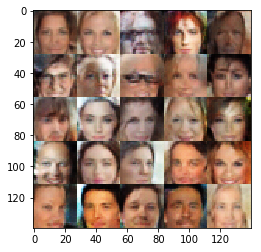

Epoch 1/2... Discriminator Loss: 1.3060... Generator Loss: 0.7634
Epoch 1/2... Discriminator Loss: 1.1708... Generator Loss: 0.8630
Epoch 1/2... Discriminator Loss: 1.2298... Generator Loss: 0.9212
Epoch 1/2... Discriminator Loss: 1.1686... Generator Loss: 0.8543
Epoch 1/2... Discriminator Loss: 1.1995... Generator Loss: 0.7510
Epoch 1/2... Discriminator Loss: 1.0543... Generator Loss: 0.9253
Epoch 1/2... Discriminator Loss: 1.2969... Generator Loss: 0.6794
Epoch 1/2... Discriminator Loss: 1.1073... Generator Loss: 0.9651
Epoch 1/2... Discriminator Loss: 1.2783... Generator Loss: 0.7105
Epoch 1/2... Discriminator Loss: 1.2529... Generator Loss: 0.7567


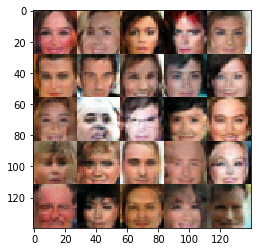

Epoch 1/2... Discriminator Loss: 1.2758... Generator Loss: 0.8084
Epoch 1/2... Discriminator Loss: 1.1569... Generator Loss: 0.7667
Epoch 1/2... Discriminator Loss: 1.3044... Generator Loss: 0.6752
Epoch 2/2... Discriminator Loss: 1.1647... Generator Loss: 0.8885
Epoch 2/2... Discriminator Loss: 1.2197... Generator Loss: 0.8804
Epoch 2/2... Discriminator Loss: 1.3824... Generator Loss: 0.6321
Epoch 2/2... Discriminator Loss: 1.3522... Generator Loss: 0.6304
Epoch 2/2... Discriminator Loss: 1.1614... Generator Loss: 0.9675
Epoch 2/2... Discriminator Loss: 1.3939... Generator Loss: 0.6076
Epoch 2/2... Discriminator Loss: 1.1087... Generator Loss: 0.9813


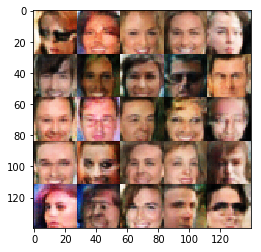

Epoch 2/2... Discriminator Loss: 1.2875... Generator Loss: 0.7646
Epoch 2/2... Discriminator Loss: 1.3185... Generator Loss: 0.7262
Epoch 2/2... Discriminator Loss: 1.3082... Generator Loss: 0.7013
Epoch 2/2... Discriminator Loss: 1.3680... Generator Loss: 0.6493
Epoch 2/2... Discriminator Loss: 1.3182... Generator Loss: 0.6966
Epoch 2/2... Discriminator Loss: 1.0810... Generator Loss: 0.9088
Epoch 2/2... Discriminator Loss: 1.2889... Generator Loss: 0.7140
Epoch 2/2... Discriminator Loss: 1.1217... Generator Loss: 0.8175
Epoch 2/2... Discriminator Loss: 1.1943... Generator Loss: 0.6900
Epoch 2/2... Discriminator Loss: 1.1775... Generator Loss: 0.8020


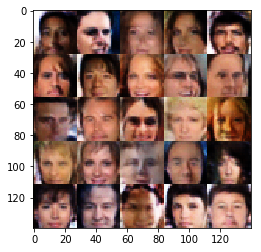

Epoch 2/2... Discriminator Loss: 1.3158... Generator Loss: 0.7308
Epoch 2/2... Discriminator Loss: 1.4877... Generator Loss: 0.5064
Epoch 2/2... Discriminator Loss: 1.4682... Generator Loss: 0.5146
Epoch 2/2... Discriminator Loss: 1.1635... Generator Loss: 0.7886
Epoch 2/2... Discriminator Loss: 1.1086... Generator Loss: 0.9584
Epoch 2/2... Discriminator Loss: 1.2830... Generator Loss: 0.6721
Epoch 2/2... Discriminator Loss: 1.2482... Generator Loss: 0.9617
Epoch 2/2... Discriminator Loss: 1.2357... Generator Loss: 0.7373
Epoch 2/2... Discriminator Loss: 1.1181... Generator Loss: 1.0532
Epoch 2/2... Discriminator Loss: 1.2044... Generator Loss: 0.8375


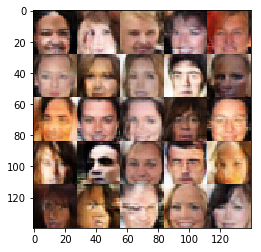

Epoch 2/2... Discriminator Loss: 1.0537... Generator Loss: 1.0453
Epoch 2/2... Discriminator Loss: 1.3152... Generator Loss: 0.7697
Epoch 2/2... Discriminator Loss: 1.0563... Generator Loss: 0.9314
Epoch 2/2... Discriminator Loss: 1.2004... Generator Loss: 0.7838
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.5841
Epoch 2/2... Discriminator Loss: 1.2145... Generator Loss: 0.7364
Epoch 2/2... Discriminator Loss: 1.2490... Generator Loss: 0.7922
Epoch 2/2... Discriminator Loss: 1.2862... Generator Loss: 0.7767
Epoch 2/2... Discriminator Loss: 1.1822... Generator Loss: 1.0476
Epoch 2/2... Discriminator Loss: 1.1218... Generator Loss: 0.8954


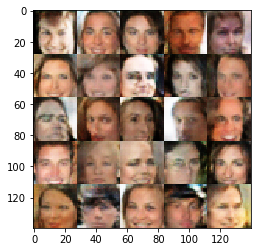

Epoch 2/2... Discriminator Loss: 1.3798... Generator Loss: 0.6020
Epoch 2/2... Discriminator Loss: 1.2265... Generator Loss: 0.7843
Epoch 2/2... Discriminator Loss: 1.1843... Generator Loss: 0.7815
Epoch 2/2... Discriminator Loss: 1.0371... Generator Loss: 1.0350
Epoch 2/2... Discriminator Loss: 1.2470... Generator Loss: 0.6720
Epoch 2/2... Discriminator Loss: 1.1274... Generator Loss: 1.0759
Epoch 2/2... Discriminator Loss: 1.2208... Generator Loss: 0.7165
Epoch 2/2... Discriminator Loss: 0.9865... Generator Loss: 1.0131
Epoch 2/2... Discriminator Loss: 1.0889... Generator Loss: 1.0143
Epoch 2/2... Discriminator Loss: 1.1314... Generator Loss: 1.0801


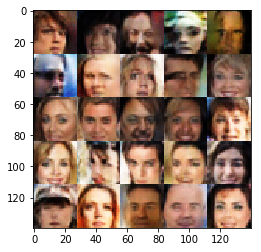

Epoch 2/2... Discriminator Loss: 0.9130... Generator Loss: 0.9758
Epoch 2/2... Discriminator Loss: 1.3953... Generator Loss: 0.6141
Epoch 2/2... Discriminator Loss: 1.3558... Generator Loss: 0.6464
Epoch 2/2... Discriminator Loss: 1.2106... Generator Loss: 0.6843
Epoch 2/2... Discriminator Loss: 1.0777... Generator Loss: 0.9322
Epoch 2/2... Discriminator Loss: 1.6154... Generator Loss: 0.4942
Epoch 2/2... Discriminator Loss: 1.2114... Generator Loss: 0.9025
Epoch 2/2... Discriminator Loss: 1.1633... Generator Loss: 0.8451
Epoch 2/2... Discriminator Loss: 1.3461... Generator Loss: 0.8222
Epoch 2/2... Discriminator Loss: 1.1117... Generator Loss: 0.9155


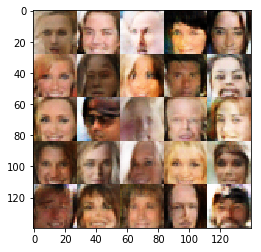

Epoch 2/2... Discriminator Loss: 1.1997... Generator Loss: 0.7886
Epoch 2/2... Discriminator Loss: 1.4243... Generator Loss: 0.6180
Epoch 2/2... Discriminator Loss: 1.2263... Generator Loss: 0.7802
Epoch 2/2... Discriminator Loss: 1.2026... Generator Loss: 0.8347
Epoch 2/2... Discriminator Loss: 1.1613... Generator Loss: 0.8663
Epoch 2/2... Discriminator Loss: 1.1440... Generator Loss: 0.8709
Epoch 2/2... Discriminator Loss: 1.1315... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 1.2810... Generator Loss: 0.8257
Epoch 2/2... Discriminator Loss: 1.2551... Generator Loss: 0.8341
Epoch 2/2... Discriminator Loss: 1.4069... Generator Loss: 0.6991


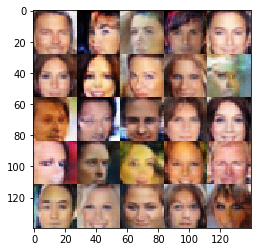

Epoch 2/2... Discriminator Loss: 1.4075... Generator Loss: 0.5591
Epoch 2/2... Discriminator Loss: 1.3406... Generator Loss: 0.6529
Epoch 2/2... Discriminator Loss: 1.1466... Generator Loss: 0.8805
Epoch 2/2... Discriminator Loss: 1.1812... Generator Loss: 0.7049
Epoch 2/2... Discriminator Loss: 1.0090... Generator Loss: 0.9787
Epoch 2/2... Discriminator Loss: 1.3196... Generator Loss: 0.6070
Epoch 2/2... Discriminator Loss: 1.1970... Generator Loss: 0.7545
Epoch 2/2... Discriminator Loss: 1.2252... Generator Loss: 0.7956
Epoch 2/2... Discriminator Loss: 1.1526... Generator Loss: 0.9152
Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 0.9031


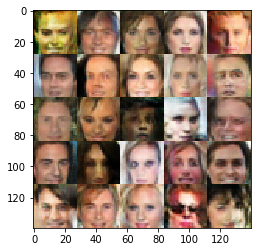

Epoch 2/2... Discriminator Loss: 1.3099... Generator Loss: 0.9861
Epoch 2/2... Discriminator Loss: 1.2849... Generator Loss: 1.0515
Epoch 2/2... Discriminator Loss: 1.2507... Generator Loss: 0.7043
Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.6244
Epoch 2/2... Discriminator Loss: 1.3037... Generator Loss: 0.7253
Epoch 2/2... Discriminator Loss: 1.1211... Generator Loss: 0.8505
Epoch 2/2... Discriminator Loss: 1.2409... Generator Loss: 0.7744
Epoch 2/2... Discriminator Loss: 1.1721... Generator Loss: 0.9618
Epoch 2/2... Discriminator Loss: 1.2274... Generator Loss: 0.7043
Epoch 2/2... Discriminator Loss: 1.3282... Generator Loss: 0.7819


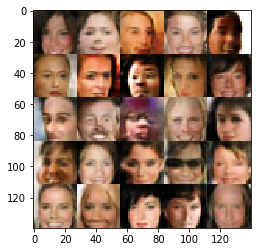

Epoch 2/2... Discriminator Loss: 1.1402... Generator Loss: 0.8629
Epoch 2/2... Discriminator Loss: 1.1940... Generator Loss: 0.8550
Epoch 2/2... Discriminator Loss: 1.0276... Generator Loss: 0.8514
Epoch 2/2... Discriminator Loss: 1.2538... Generator Loss: 0.8278
Epoch 2/2... Discriminator Loss: 1.4381... Generator Loss: 0.5767
Epoch 2/2... Discriminator Loss: 1.2541... Generator Loss: 0.8017
Epoch 2/2... Discriminator Loss: 1.1676... Generator Loss: 0.8499
Epoch 2/2... Discriminator Loss: 1.1204... Generator Loss: 0.9151
Epoch 2/2... Discriminator Loss: 1.3817... Generator Loss: 0.6311
Epoch 2/2... Discriminator Loss: 0.9699... Generator Loss: 1.0810


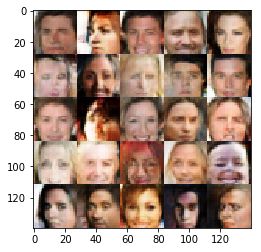

Epoch 2/2... Discriminator Loss: 1.3645... Generator Loss: 0.7080
Epoch 2/2... Discriminator Loss: 1.1131... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 1.0833... Generator Loss: 0.8319
Epoch 2/2... Discriminator Loss: 1.4087... Generator Loss: 0.6681
Epoch 2/2... Discriminator Loss: 1.1223... Generator Loss: 1.0498
Epoch 2/2... Discriminator Loss: 1.7676... Generator Loss: 0.4997
Epoch 2/2... Discriminator Loss: 1.2287... Generator Loss: 0.8061
Epoch 2/2... Discriminator Loss: 1.3241... Generator Loss: 0.6010
Epoch 2/2... Discriminator Loss: 1.2103... Generator Loss: 0.8287
Epoch 2/2... Discriminator Loss: 1.2874... Generator Loss: 0.6764


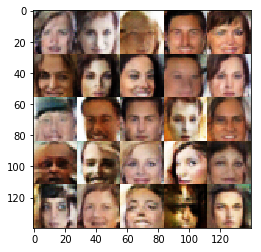

Epoch 2/2... Discriminator Loss: 1.0069... Generator Loss: 1.0385
Epoch 2/2... Discriminator Loss: 1.1842... Generator Loss: 0.8481
Epoch 2/2... Discriminator Loss: 1.2513... Generator Loss: 0.7408
Epoch 2/2... Discriminator Loss: 1.2017... Generator Loss: 0.8054
Epoch 2/2... Discriminator Loss: 1.3198... Generator Loss: 0.7227
Epoch 2/2... Discriminator Loss: 1.5005... Generator Loss: 0.5416
Epoch 2/2... Discriminator Loss: 1.2392... Generator Loss: 0.6669
Epoch 2/2... Discriminator Loss: 1.3035... Generator Loss: 0.8334
Epoch 2/2... Discriminator Loss: 1.3780... Generator Loss: 0.6343
Epoch 2/2... Discriminator Loss: 1.3486... Generator Loss: 0.6707


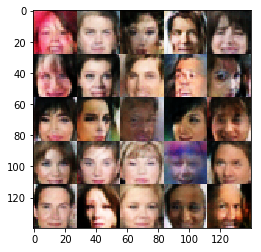

Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 0.9323
Epoch 2/2... Discriminator Loss: 1.4364... Generator Loss: 0.6116
Epoch 2/2... Discriminator Loss: 1.6464... Generator Loss: 0.5000
Epoch 2/2... Discriminator Loss: 1.3087... Generator Loss: 0.7102
Epoch 2/2... Discriminator Loss: 1.1703... Generator Loss: 0.8254
Epoch 2/2... Discriminator Loss: 1.1321... Generator Loss: 0.7979
Epoch 2/2... Discriminator Loss: 1.3306... Generator Loss: 0.6874
Epoch 2/2... Discriminator Loss: 1.4114... Generator Loss: 0.6264
Epoch 2/2... Discriminator Loss: 1.2910... Generator Loss: 0.8500
Epoch 2/2... Discriminator Loss: 1.3694... Generator Loss: 0.6606


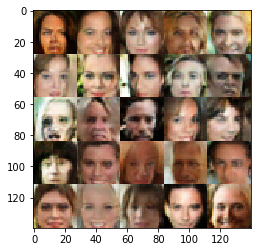

Epoch 2/2... Discriminator Loss: 1.3264... Generator Loss: 0.6214
Epoch 2/2... Discriminator Loss: 1.1322... Generator Loss: 0.9172
Epoch 2/2... Discriminator Loss: 1.1663... Generator Loss: 0.7372
Epoch 2/2... Discriminator Loss: 1.2495... Generator Loss: 0.9088
Epoch 2/2... Discriminator Loss: 1.2248... Generator Loss: 0.8173
Epoch 2/2... Discriminator Loss: 1.1184... Generator Loss: 0.9850
Epoch 2/2... Discriminator Loss: 0.9443... Generator Loss: 1.1905
Epoch 2/2... Discriminator Loss: 1.8641... Generator Loss: 0.3518
Epoch 2/2... Discriminator Loss: 1.3366... Generator Loss: 0.7080
Epoch 2/2... Discriminator Loss: 1.1065... Generator Loss: 1.0061


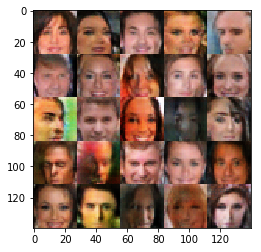

Epoch 2/2... Discriminator Loss: 1.2185... Generator Loss: 0.7249
Epoch 2/2... Discriminator Loss: 1.0770... Generator Loss: 0.8297
Epoch 2/2... Discriminator Loss: 1.3501... Generator Loss: 0.6128
Epoch 2/2... Discriminator Loss: 1.1447... Generator Loss: 0.9179
Epoch 2/2... Discriminator Loss: 1.1898... Generator Loss: 0.7672
Epoch 2/2... Discriminator Loss: 1.2136... Generator Loss: 0.7555
Epoch 2/2... Discriminator Loss: 1.1439... Generator Loss: 0.9216
Epoch 2/2... Discriminator Loss: 1.3994... Generator Loss: 0.5893
Epoch 2/2... Discriminator Loss: 1.1135... Generator Loss: 0.8987
Epoch 2/2... Discriminator Loss: 1.5109... Generator Loss: 0.5368


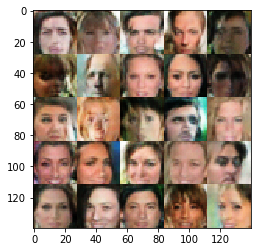

Epoch 2/2... Discriminator Loss: 1.3295... Generator Loss: 0.6580
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 0.6219
Epoch 2/2... Discriminator Loss: 1.1637... Generator Loss: 0.9617
Epoch 2/2... Discriminator Loss: 1.2859... Generator Loss: 0.8042
Epoch 2/2... Discriminator Loss: 1.2912... Generator Loss: 0.7128
Epoch 2/2... Discriminator Loss: 1.1562... Generator Loss: 0.7348
Epoch 2/2... Discriminator Loss: 1.1796... Generator Loss: 0.8482
Epoch 2/2... Discriminator Loss: 1.3348... Generator Loss: 0.6823
Epoch 2/2... Discriminator Loss: 1.3344... Generator Loss: 0.5995
Epoch 2/2... Discriminator Loss: 1.0501... Generator Loss: 1.0107


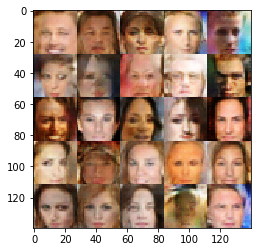

Epoch 2/2... Discriminator Loss: 1.4097... Generator Loss: 0.6323
Epoch 2/2... Discriminator Loss: 1.1703... Generator Loss: 0.7552
Epoch 2/2... Discriminator Loss: 1.4102... Generator Loss: 0.6570
Epoch 2/2... Discriminator Loss: 1.1225... Generator Loss: 0.8069
Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 1.0664
Epoch 2/2... Discriminator Loss: 1.4721... Generator Loss: 0.5612
Epoch 2/2... Discriminator Loss: 1.1050... Generator Loss: 0.8971
Epoch 2/2... Discriminator Loss: 1.1114... Generator Loss: 0.9933
Epoch 2/2... Discriminator Loss: 1.2793... Generator Loss: 0.7135
Epoch 2/2... Discriminator Loss: 1.2114... Generator Loss: 0.7535


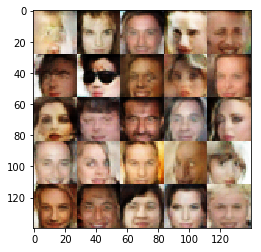

Epoch 2/2... Discriminator Loss: 1.0216... Generator Loss: 0.9397
Epoch 2/2... Discriminator Loss: 1.3807... Generator Loss: 0.6429
Epoch 2/2... Discriminator Loss: 1.2410... Generator Loss: 0.7558
Epoch 2/2... Discriminator Loss: 1.0958... Generator Loss: 0.8186
Epoch 2/2... Discriminator Loss: 1.3967... Generator Loss: 0.6993
Epoch 2/2... Discriminator Loss: 1.3289... Generator Loss: 0.7406
Epoch 2/2... Discriminator Loss: 1.1585... Generator Loss: 0.9863
Epoch 2/2... Discriminator Loss: 1.2153... Generator Loss: 0.7914
Epoch 2/2... Discriminator Loss: 1.2310... Generator Loss: 0.7738
Epoch 2/2... Discriminator Loss: 1.2015... Generator Loss: 0.7789


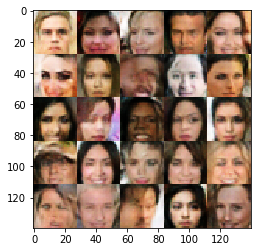

Epoch 2/2... Discriminator Loss: 1.3613... Generator Loss: 0.7161
Epoch 2/2... Discriminator Loss: 1.1183... Generator Loss: 0.8279
Epoch 2/2... Discriminator Loss: 1.0695... Generator Loss: 1.1066
Epoch 2/2... Discriminator Loss: 1.1910... Generator Loss: 0.8649
Epoch 2/2... Discriminator Loss: 1.2932... Generator Loss: 0.7711
Epoch 2/2... Discriminator Loss: 1.3703... Generator Loss: 0.5859
Epoch 2/2... Discriminator Loss: 1.3705... Generator Loss: 0.6253
Epoch 2/2... Discriminator Loss: 1.4574... Generator Loss: 0.5077
Epoch 2/2... Discriminator Loss: 1.0692... Generator Loss: 0.9781
Epoch 2/2... Discriminator Loss: 1.3057... Generator Loss: 0.7334


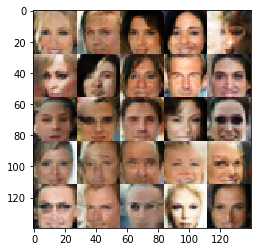

Epoch 2/2... Discriminator Loss: 1.1434... Generator Loss: 0.9200
Epoch 2/2... Discriminator Loss: 1.2031... Generator Loss: 0.7221
Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.6516
Epoch 2/2... Discriminator Loss: 1.2690... Generator Loss: 0.7175
Epoch 2/2... Discriminator Loss: 1.1972... Generator Loss: 0.7538
Epoch 2/2... Discriminator Loss: 1.3656... Generator Loss: 0.6117
Epoch 2/2... Discriminator Loss: 1.1104... Generator Loss: 0.9917
Epoch 2/2... Discriminator Loss: 1.3450... Generator Loss: 0.6288
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.8850
Epoch 2/2... Discriminator Loss: 1.6947... Generator Loss: 0.4093


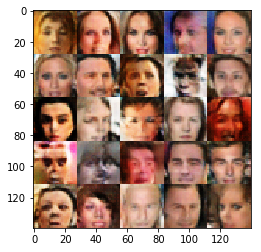

Epoch 2/2... Discriminator Loss: 1.2104... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.0206... Generator Loss: 0.9719
Epoch 2/2... Discriminator Loss: 1.4411... Generator Loss: 0.6206
Epoch 2/2... Discriminator Loss: 1.2240... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 1.3201... Generator Loss: 0.6803
Epoch 2/2... Discriminator Loss: 1.0558... Generator Loss: 0.8661
Epoch 2/2... Discriminator Loss: 1.6669... Generator Loss: 0.5807
Epoch 2/2... Discriminator Loss: 1.1613... Generator Loss: 0.8210
Epoch 2/2... Discriminator Loss: 1.4364... Generator Loss: 0.7067
Epoch 2/2... Discriminator Loss: 1.3786... Generator Loss: 0.6911


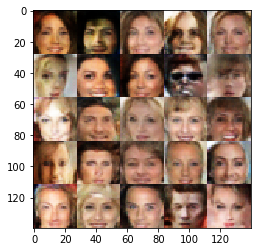

Epoch 2/2... Discriminator Loss: 1.4842... Generator Loss: 0.5335
Epoch 2/2... Discriminator Loss: 1.2302... Generator Loss: 0.7908
Epoch 2/2... Discriminator Loss: 1.2715... Generator Loss: 0.8328
Epoch 2/2... Discriminator Loss: 1.2596... Generator Loss: 0.7345
Epoch 2/2... Discriminator Loss: 1.2953... Generator Loss: 0.7925
Epoch 2/2... Discriminator Loss: 1.2233... Generator Loss: 0.7982
Epoch 2/2... Discriminator Loss: 1.2314... Generator Loss: 0.7760
Epoch 2/2... Discriminator Loss: 1.3103... Generator Loss: 0.6097
Epoch 2/2... Discriminator Loss: 1.6804... Generator Loss: 0.5024
Epoch 2/2... Discriminator Loss: 1.3228... Generator Loss: 0.7023


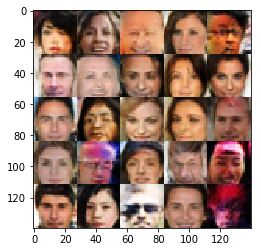

Epoch 2/2... Discriminator Loss: 1.2993... Generator Loss: 0.7512
Epoch 2/2... Discriminator Loss: 1.1576... Generator Loss: 0.7666
Epoch 2/2... Discriminator Loss: 1.2394... Generator Loss: 0.7112
Epoch 2/2... Discriminator Loss: 1.1753... Generator Loss: 0.7449
Epoch 2/2... Discriminator Loss: 1.2552... Generator Loss: 0.7024
Epoch 2/2... Discriminator Loss: 1.2702... Generator Loss: 0.7694
Epoch 2/2... Discriminator Loss: 1.1406... Generator Loss: 0.9695
Epoch 2/2... Discriminator Loss: 1.1737... Generator Loss: 0.7957
Epoch 2/2... Discriminator Loss: 1.0772... Generator Loss: 1.1183
Epoch 2/2... Discriminator Loss: 1.1356... Generator Loss: 0.8204


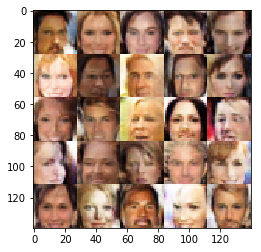

Epoch 2/2... Discriminator Loss: 1.2631... Generator Loss: 0.6908
Epoch 2/2... Discriminator Loss: 1.2040... Generator Loss: 0.8357
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 0.5951
Epoch 2/2... Discriminator Loss: 1.2955... Generator Loss: 0.7032
Epoch 2/2... Discriminator Loss: 1.4242... Generator Loss: 0.7191
Epoch 2/2... Discriminator Loss: 1.3650... Generator Loss: 0.5739
Epoch 2/2... Discriminator Loss: 1.2536... Generator Loss: 0.8218
Epoch 2/2... Discriminator Loss: 1.2640... Generator Loss: 0.6961
Epoch 2/2... Discriminator Loss: 1.2140... Generator Loss: 0.7178
Epoch 2/2... Discriminator Loss: 1.1830... Generator Loss: 0.7248


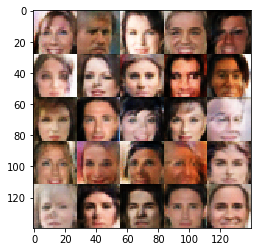

Epoch 2/2... Discriminator Loss: 1.1782... Generator Loss: 0.6893
Epoch 2/2... Discriminator Loss: 1.4047... Generator Loss: 0.6173
Epoch 2/2... Discriminator Loss: 1.2416... Generator Loss: 0.6374
Epoch 2/2... Discriminator Loss: 1.1372... Generator Loss: 0.8642
Epoch 2/2... Discriminator Loss: 1.1771... Generator Loss: 0.7548
Epoch 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.7326
Epoch 2/2... Discriminator Loss: 1.2350... Generator Loss: 0.8897
Epoch 2/2... Discriminator Loss: 1.2104... Generator Loss: 0.8235
Epoch 2/2... Discriminator Loss: 1.0892... Generator Loss: 1.0857
Epoch 2/2... Discriminator Loss: 1.5583... Generator Loss: 0.5229


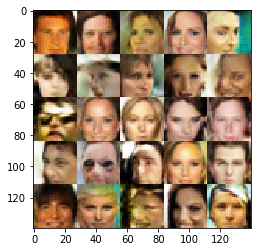

Epoch 2/2... Discriminator Loss: 1.2788... Generator Loss: 0.7186
Epoch 2/2... Discriminator Loss: 1.4438... Generator Loss: 0.7188
Epoch 2/2... Discriminator Loss: 1.3876... Generator Loss: 0.5192
Epoch 2/2... Discriminator Loss: 1.4306... Generator Loss: 0.5657
Epoch 2/2... Discriminator Loss: 1.2333... Generator Loss: 0.7515
Epoch 2/2... Discriminator Loss: 1.2584... Generator Loss: 0.7314
Epoch 2/2... Discriminator Loss: 1.1738... Generator Loss: 0.7446
Epoch 2/2... Discriminator Loss: 1.2492... Generator Loss: 0.7913
Epoch 2/2... Discriminator Loss: 1.2698... Generator Loss: 0.6175
Epoch 2/2... Discriminator Loss: 1.4985... Generator Loss: 0.6810


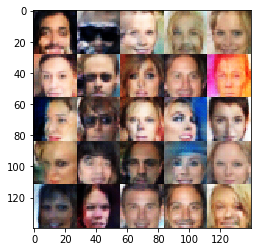

Epoch 2/2... Discriminator Loss: 1.2554... Generator Loss: 0.7663
Epoch 2/2... Discriminator Loss: 1.3402... Generator Loss: 0.8086
Epoch 2/2... Discriminator Loss: 1.2963... Generator Loss: 0.7149
Epoch 2/2... Discriminator Loss: 1.1848... Generator Loss: 0.7442
Epoch 2/2... Discriminator Loss: 1.2476... Generator Loss: 0.7331
Epoch 2/2... Discriminator Loss: 1.2970... Generator Loss: 0.7377
Epoch 2/2... Discriminator Loss: 1.2069... Generator Loss: 0.7201
Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 0.9191
Epoch 2/2... Discriminator Loss: 1.6645... Generator Loss: 0.4770
Epoch 2/2... Discriminator Loss: 1.1701... Generator Loss: 0.7693


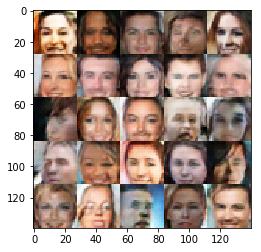

Epoch 2/2... Discriminator Loss: 1.0685... Generator Loss: 0.8999
Epoch 2/2... Discriminator Loss: 1.1581... Generator Loss: 0.8019
Epoch 2/2... Discriminator Loss: 1.2179... Generator Loss: 0.9009
Epoch 2/2... Discriminator Loss: 1.1896... Generator Loss: 0.9030
Epoch 2/2... Discriminator Loss: 1.3861... Generator Loss: 0.5839
Epoch 2/2... Discriminator Loss: 1.3953... Generator Loss: 0.6126
Epoch 2/2... Discriminator Loss: 1.3283... Generator Loss: 0.6117
Epoch 2/2... Discriminator Loss: 1.2819... Generator Loss: 0.6247
Epoch 2/2... Discriminator Loss: 1.1695... Generator Loss: 0.7682
Epoch 2/2... Discriminator Loss: 1.0269... Generator Loss: 1.1844


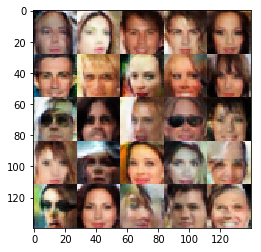

Epoch 2/2... Discriminator Loss: 1.1740... Generator Loss: 0.8669
Epoch 2/2... Discriminator Loss: 1.5041... Generator Loss: 0.5684
Epoch 2/2... Discriminator Loss: 1.1018... Generator Loss: 0.8042
Epoch 2/2... Discriminator Loss: 1.0367... Generator Loss: 1.0004
Epoch 2/2... Discriminator Loss: 1.3005... Generator Loss: 0.7578
Epoch 2/2... Discriminator Loss: 1.4869... Generator Loss: 0.5356
Epoch 2/2... Discriminator Loss: 1.1147... Generator Loss: 0.8787
Epoch 2/2... Discriminator Loss: 1.2582... Generator Loss: 0.6646
Epoch 2/2... Discriminator Loss: 1.2496... Generator Loss: 0.7700
Epoch 2/2... Discriminator Loss: 1.1106... Generator Loss: 0.8107


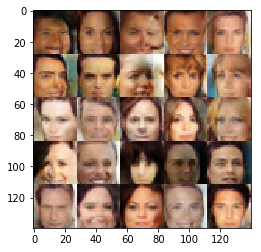

Epoch 2/2... Discriminator Loss: 1.3532... Generator Loss: 0.6263
Epoch 2/2... Discriminator Loss: 1.2378... Generator Loss: 0.8687
Epoch 2/2... Discriminator Loss: 1.5500... Generator Loss: 0.7968
Epoch 2/2... Discriminator Loss: 1.3516... Generator Loss: 0.7039
Epoch 2/2... Discriminator Loss: 1.3388... Generator Loss: 0.6023
Epoch 2/2... Discriminator Loss: 1.1590... Generator Loss: 0.8252
Epoch 2/2... Discriminator Loss: 1.0450... Generator Loss: 1.0019
Epoch 2/2... Discriminator Loss: 1.2566... Generator Loss: 0.9897
Epoch 2/2... Discriminator Loss: 1.1751... Generator Loss: 0.8158
Epoch 2/2... Discriminator Loss: 1.1765... Generator Loss: 0.7661


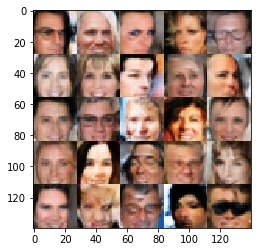

Epoch 2/2... Discriminator Loss: 1.2935... Generator Loss: 0.6997
Epoch 2/2... Discriminator Loss: 1.3484... Generator Loss: 0.6605
Epoch 2/2... Discriminator Loss: 1.2645... Generator Loss: 0.7516
Epoch 2/2... Discriminator Loss: 1.3945... Generator Loss: 0.6535
Epoch 2/2... Discriminator Loss: 1.4253... Generator Loss: 0.5880
Epoch 2/2... Discriminator Loss: 1.2531... Generator Loss: 0.9033
Epoch 2/2... Discriminator Loss: 1.0082... Generator Loss: 1.0088
Epoch 2/2... Discriminator Loss: 1.2892... Generator Loss: 0.7440
Epoch 2/2... Discriminator Loss: 1.4512... Generator Loss: 0.4840
Epoch 2/2... Discriminator Loss: 1.2687... Generator Loss: 0.6980


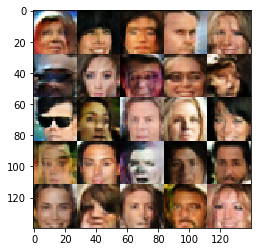

Epoch 2/2... Discriminator Loss: 1.1256... Generator Loss: 0.7894
Epoch 2/2... Discriminator Loss: 1.1540... Generator Loss: 0.8289
Epoch 2/2... Discriminator Loss: 1.1436... Generator Loss: 0.8095
Epoch 2/2... Discriminator Loss: 1.1986... Generator Loss: 0.7596
Epoch 2/2... Discriminator Loss: 1.0633... Generator Loss: 0.9943
Epoch 2/2... Discriminator Loss: 1.1526... Generator Loss: 0.9902
Epoch 2/2... Discriminator Loss: 1.1814... Generator Loss: 0.8580
Epoch 2/2... Discriminator Loss: 1.2275... Generator Loss: 0.6778
Epoch 2/2... Discriminator Loss: 1.0850... Generator Loss: 0.9069
Epoch 2/2... Discriminator Loss: 1.2964... Generator Loss: 0.5811


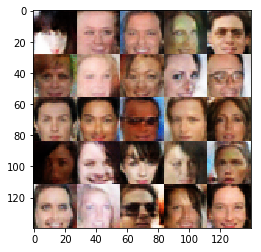

Epoch 2/2... Discriminator Loss: 1.2427... Generator Loss: 0.8464
Epoch 2/2... Discriminator Loss: 1.1105... Generator Loss: 0.8503
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 0.5843
Epoch 2/2... Discriminator Loss: 1.2794... Generator Loss: 0.6709
Epoch 2/2... Discriminator Loss: 1.5048... Generator Loss: 0.5617
Epoch 2/2... Discriminator Loss: 1.1498... Generator Loss: 0.7944
Epoch 2/2... Discriminator Loss: 1.2494... Generator Loss: 0.7129
Epoch 2/2... Discriminator Loss: 1.2423... Generator Loss: 0.9028
Epoch 2/2... Discriminator Loss: 1.1324... Generator Loss: 0.7664
Epoch 2/2... Discriminator Loss: 1.2549... Generator Loss: 0.7047


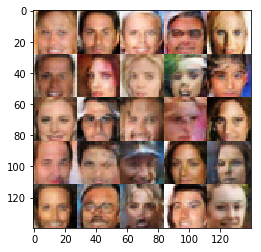

Epoch 2/2... Discriminator Loss: 1.1532... Generator Loss: 0.9259
Epoch 2/2... Discriminator Loss: 1.2770... Generator Loss: 0.7042
Epoch 2/2... Discriminator Loss: 0.9257... Generator Loss: 1.1927
Epoch 2/2... Discriminator Loss: 1.3051... Generator Loss: 0.7354
Epoch 2/2... Discriminator Loss: 1.1240... Generator Loss: 1.0290
Epoch 2/2... Discriminator Loss: 1.1479... Generator Loss: 0.7980
Epoch 2/2... Discriminator Loss: 1.2884... Generator Loss: 0.7579
Epoch 2/2... Discriminator Loss: 0.8615... Generator Loss: 1.0313
Epoch 2/2... Discriminator Loss: 1.4470... Generator Loss: 0.5375
Epoch 2/2... Discriminator Loss: 1.2623... Generator Loss: 0.7589


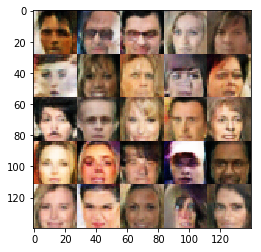

Epoch 2/2... Discriminator Loss: 1.1606... Generator Loss: 1.0007
Epoch 2/2... Discriminator Loss: 1.1539... Generator Loss: 0.9350
Epoch 2/2... Discriminator Loss: 1.5180... Generator Loss: 0.4144
Epoch 2/2... Discriminator Loss: 1.3153... Generator Loss: 0.8029
Epoch 2/2... Discriminator Loss: 1.2992... Generator Loss: 0.6703
Epoch 2/2... Discriminator Loss: 1.1161... Generator Loss: 1.1150
Epoch 2/2... Discriminator Loss: 1.2587... Generator Loss: 0.7844
Epoch 2/2... Discriminator Loss: 1.3809... Generator Loss: 0.7210
Epoch 2/2... Discriminator Loss: 1.2512... Generator Loss: 0.6745
Epoch 2/2... Discriminator Loss: 1.3703... Generator Loss: 0.7038


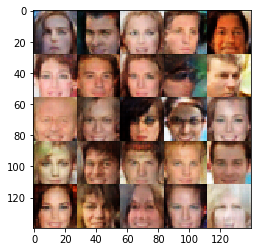

Epoch 2/2... Discriminator Loss: 1.4092... Generator Loss: 0.5980
Epoch 2/2... Discriminator Loss: 1.2998... Generator Loss: 0.6480
Epoch 2/2... Discriminator Loss: 1.3401... Generator Loss: 0.6061
Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 1.1180
Epoch 2/2... Discriminator Loss: 1.2959... Generator Loss: 0.7485
Epoch 2/2... Discriminator Loss: 1.3468... Generator Loss: 0.7252
Epoch 2/2... Discriminator Loss: 1.1936... Generator Loss: 0.6838
Epoch 2/2... Discriminator Loss: 1.2285... Generator Loss: 0.8065
Epoch 2/2... Discriminator Loss: 1.2779... Generator Loss: 0.7526
Epoch 2/2... Discriminator Loss: 1.2174... Generator Loss: 0.8212


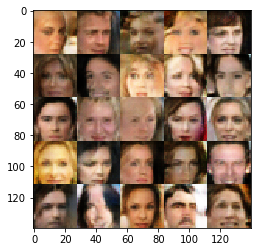

Epoch 2/2... Discriminator Loss: 1.3222... Generator Loss: 0.6477
Epoch 2/2... Discriminator Loss: 1.0766... Generator Loss: 0.8580
Epoch 2/2... Discriminator Loss: 1.3267... Generator Loss: 0.6368
Epoch 2/2... Discriminator Loss: 1.2060... Generator Loss: 0.7428
Epoch 2/2... Discriminator Loss: 1.2821... Generator Loss: 0.6514
Epoch 2/2... Discriminator Loss: 1.1754... Generator Loss: 0.7915
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.7929
Epoch 2/2... Discriminator Loss: 1.1351... Generator Loss: 0.8233
Epoch 2/2... Discriminator Loss: 1.1832... Generator Loss: 0.8606
Epoch 2/2... Discriminator Loss: 1.2231... Generator Loss: 0.7222


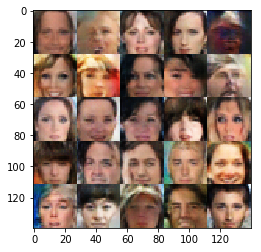

Epoch 2/2... Discriminator Loss: 1.1783... Generator Loss: 0.8349
Epoch 2/2... Discriminator Loss: 1.2645... Generator Loss: 0.7863
Epoch 2/2... Discriminator Loss: 1.2189... Generator Loss: 0.7705
Epoch 2/2... Discriminator Loss: 1.3280... Generator Loss: 0.7628
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 0.9519
Epoch 2/2... Discriminator Loss: 1.2789... Generator Loss: 0.8108
Epoch 2/2... Discriminator Loss: 1.3389... Generator Loss: 0.6596
Epoch 2/2... Discriminator Loss: 0.8066... Generator Loss: 1.2005
Epoch 2/2... Discriminator Loss: 1.0917... Generator Loss: 0.9405
Epoch 2/2... Discriminator Loss: 1.1754... Generator Loss: 0.9001


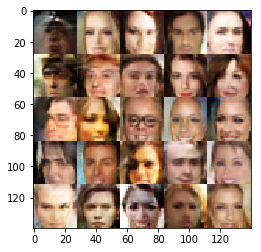

Epoch 2/2... Discriminator Loss: 1.1872... Generator Loss: 0.7380
Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 0.7844
Epoch 2/2... Discriminator Loss: 1.4063... Generator Loss: 0.6703
Epoch 2/2... Discriminator Loss: 1.2006... Generator Loss: 0.6963
Epoch 2/2... Discriminator Loss: 1.3117... Generator Loss: 0.6616
Epoch 2/2... Discriminator Loss: 1.1238... Generator Loss: 0.8605
Epoch 2/2... Discriminator Loss: 1.3478... Generator Loss: 0.7752
Epoch 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.7617
Epoch 2/2... Discriminator Loss: 1.1230... Generator Loss: 0.8341
Epoch 2/2... Discriminator Loss: 1.0561... Generator Loss: 0.8652


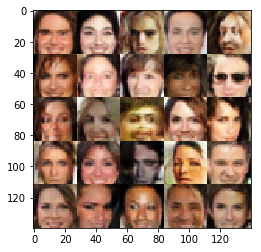

Epoch 2/2... Discriminator Loss: 1.3033... Generator Loss: 0.5885
Epoch 2/2... Discriminator Loss: 1.6361... Generator Loss: 0.5324
Epoch 2/2... Discriminator Loss: 1.1369... Generator Loss: 0.7458
Epoch 2/2... Discriminator Loss: 1.3408... Generator Loss: 0.7210
Epoch 2/2... Discriminator Loss: 1.4082... Generator Loss: 0.6506
Epoch 2/2... Discriminator Loss: 1.1957... Generator Loss: 0.7282
Epoch 2/2... Discriminator Loss: 1.2351... Generator Loss: 0.7056
Epoch 2/2... Discriminator Loss: 1.3238... Generator Loss: 0.6941
Epoch 2/2... Discriminator Loss: 1.1741... Generator Loss: 0.7890
Epoch 2/2... Discriminator Loss: 1.3099... Generator Loss: 0.6460


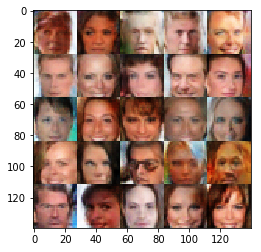

Epoch 2/2... Discriminator Loss: 1.0831... Generator Loss: 0.8210
Epoch 2/2... Discriminator Loss: 1.3365... Generator Loss: 0.5851
Epoch 2/2... Discriminator Loss: 1.1884... Generator Loss: 0.8917
Epoch 2/2... Discriminator Loss: 1.3064... Generator Loss: 0.6680
Epoch 2/2... Discriminator Loss: 1.2702... Generator Loss: 0.7219
Epoch 2/2... Discriminator Loss: 1.2008... Generator Loss: 0.8049
Epoch 2/2... Discriminator Loss: 1.2295... Generator Loss: 0.7532
Epoch 2/2... Discriminator Loss: 0.8834... Generator Loss: 1.0575
Epoch 2/2... Discriminator Loss: 1.3239... Generator Loss: 0.7036
Epoch 2/2... Discriminator Loss: 1.2644... Generator Loss: 0.6737


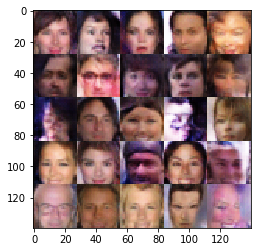

Epoch 2/2... Discriminator Loss: 1.1882... Generator Loss: 0.7067
Epoch 2/2... Discriminator Loss: 1.1374... Generator Loss: 0.7236
Epoch 2/2... Discriminator Loss: 1.1748... Generator Loss: 0.8672
Epoch 2/2... Discriminator Loss: 1.3321... Generator Loss: 0.6361
Epoch 2/2... Discriminator Loss: 1.1418... Generator Loss: 0.8392
Epoch 2/2... Discriminator Loss: 1.6679... Generator Loss: 0.5213
Epoch 2/2... Discriminator Loss: 1.3579... Generator Loss: 0.6578
Epoch 2/2... Discriminator Loss: 1.3639... Generator Loss: 0.6229
Epoch 2/2... Discriminator Loss: 1.5140... Generator Loss: 0.5433
Epoch 2/2... Discriminator Loss: 1.2900... Generator Loss: 0.6736


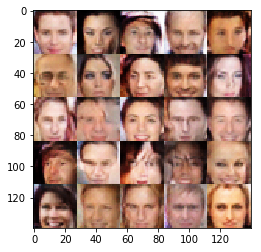

Epoch 2/2... Discriminator Loss: 1.3045... Generator Loss: 0.6623
Epoch 2/2... Discriminator Loss: 1.4578... Generator Loss: 0.5306
Epoch 2/2... Discriminator Loss: 1.2620... Generator Loss: 0.7209
Epoch 2/2... Discriminator Loss: 1.0902... Generator Loss: 0.8449
Epoch 2/2... Discriminator Loss: 1.1575... Generator Loss: 0.8292
Epoch 2/2... Discriminator Loss: 1.0700... Generator Loss: 0.9573
Epoch 2/2... Discriminator Loss: 1.4487... Generator Loss: 0.5937
Epoch 2/2... Discriminator Loss: 1.2237... Generator Loss: 0.7798
Epoch 2/2... Discriminator Loss: 1.1975... Generator Loss: 0.6864
Epoch 2/2... Discriminator Loss: 1.3277... Generator Loss: 0.6790


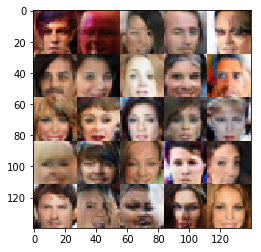

Epoch 2/2... Discriminator Loss: 1.2255... Generator Loss: 0.7219
Epoch 2/2... Discriminator Loss: 1.2815... Generator Loss: 0.5983
Epoch 2/2... Discriminator Loss: 1.2662... Generator Loss: 0.9788
Epoch 2/2... Discriminator Loss: 1.2317... Generator Loss: 0.7864
Epoch 2/2... Discriminator Loss: 1.2435... Generator Loss: 0.7792
Epoch 2/2... Discriminator Loss: 1.2341... Generator Loss: 0.6949
Epoch 2/2... Discriminator Loss: 1.3670... Generator Loss: 0.6764
Epoch 2/2... Discriminator Loss: 1.2063... Generator Loss: 0.7169
Epoch 2/2... Discriminator Loss: 1.2267... Generator Loss: 0.7227
Epoch 2/2... Discriminator Loss: 1.1419... Generator Loss: 0.9426


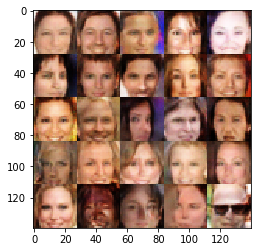

Epoch 2/2... Discriminator Loss: 1.2047... Generator Loss: 0.7447
Epoch 2/2... Discriminator Loss: 1.3395... Generator Loss: 0.6631
Epoch 2/2... Discriminator Loss: 1.1323... Generator Loss: 0.8030
Epoch 2/2... Discriminator Loss: 1.4369... Generator Loss: 0.5367
Epoch 2/2... Discriminator Loss: 1.2208... Generator Loss: 0.8761
Epoch 2/2... Discriminator Loss: 1.1818... Generator Loss: 0.7777
Epoch 2/2... Discriminator Loss: 1.5054... Generator Loss: 0.4823
Epoch 2/2... Discriminator Loss: 1.5268... Generator Loss: 0.6109
Epoch 2/2... Discriminator Loss: 1.3354... Generator Loss: 0.6811
Epoch 2/2... Discriminator Loss: 1.1651... Generator Loss: 0.8540


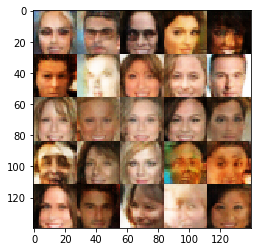

Epoch 2/2... Discriminator Loss: 1.2023... Generator Loss: 0.7539
Epoch 2/2... Discriminator Loss: 1.2863... Generator Loss: 0.6132
Epoch 2/2... Discriminator Loss: 1.2929... Generator Loss: 0.7060
Epoch 2/2... Discriminator Loss: 1.3458... Generator Loss: 0.8201
Epoch 2/2... Discriminator Loss: 1.1312... Generator Loss: 0.9082
Epoch 2/2... Discriminator Loss: 1.2736... Generator Loss: 0.6665
Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 0.9552
Epoch 2/2... Discriminator Loss: 1.3725... Generator Loss: 0.6431
Epoch 2/2... Discriminator Loss: 1.4778... Generator Loss: 0.5617
Epoch 2/2... Discriminator Loss: 1.5413... Generator Loss: 0.5264


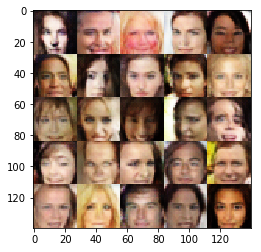

Epoch 2/2... Discriminator Loss: 1.3156... Generator Loss: 0.6580
Epoch 2/2... Discriminator Loss: 1.0022... Generator Loss: 1.0769
Epoch 2/2... Discriminator Loss: 1.3282... Generator Loss: 0.6011
Epoch 2/2... Discriminator Loss: 1.0130... Generator Loss: 1.0112
Epoch 2/2... Discriminator Loss: 1.2111... Generator Loss: 0.7054
Epoch 2/2... Discriminator Loss: 1.5727... Generator Loss: 0.4842
Epoch 2/2... Discriminator Loss: 1.2808... Generator Loss: 0.6730
Epoch 2/2... Discriminator Loss: 1.0449... Generator Loss: 0.8081
Epoch 2/2... Discriminator Loss: 1.3181... Generator Loss: 0.6216
Epoch 2/2... Discriminator Loss: 1.1568... Generator Loss: 0.8267


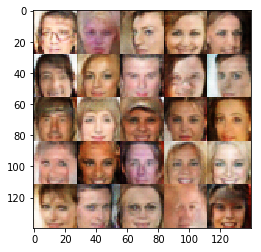

Epoch 2/2... Discriminator Loss: 1.0972... Generator Loss: 0.9128
Epoch 2/2... Discriminator Loss: 1.4054... Generator Loss: 0.6098
Epoch 2/2... Discriminator Loss: 1.4005... Generator Loss: 0.6553
Epoch 2/2... Discriminator Loss: 1.3206... Generator Loss: 0.6305
Epoch 2/2... Discriminator Loss: 1.3866... Generator Loss: 0.6694
Epoch 2/2... Discriminator Loss: 1.1243... Generator Loss: 0.9276
Epoch 2/2... Discriminator Loss: 1.7616... Generator Loss: 0.5022
Epoch 2/2... Discriminator Loss: 1.3604... Generator Loss: 0.5715
Epoch 2/2... Discriminator Loss: 1.2730... Generator Loss: 0.8114
Epoch 2/2... Discriminator Loss: 1.3446... Generator Loss: 0.6670


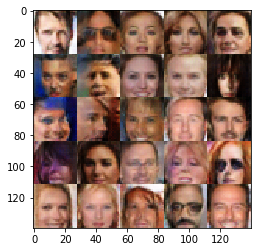

Epoch 2/2... Discriminator Loss: 1.2493... Generator Loss: 0.8056
Epoch 2/2... Discriminator Loss: 1.3610... Generator Loss: 0.6712
Epoch 2/2... Discriminator Loss: 1.3040... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 1.2125... Generator Loss: 0.7167
Epoch 2/2... Discriminator Loss: 1.2760... Generator Loss: 0.7868
Epoch 2/2... Discriminator Loss: 1.1714... Generator Loss: 0.8276
Epoch 2/2... Discriminator Loss: 1.2823... Generator Loss: 0.6851
Epoch 2/2... Discriminator Loss: 1.3554... Generator Loss: 0.8122
Epoch 2/2... Discriminator Loss: 1.2662... Generator Loss: 0.8066
Epoch 2/2... Discriminator Loss: 1.1071... Generator Loss: 0.7687


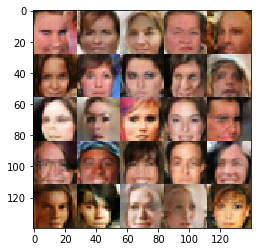

Epoch 2/2... Discriminator Loss: 1.1857... Generator Loss: 0.7762
Epoch 2/2... Discriminator Loss: 1.4124... Generator Loss: 0.6287
Epoch 2/2... Discriminator Loss: 1.3767... Generator Loss: 0.6364
Epoch 2/2... Discriminator Loss: 1.2723... Generator Loss: 0.6721
Epoch 2/2... Discriminator Loss: 1.2828... Generator Loss: 0.6724
Epoch 2/2... Discriminator Loss: 1.0526... Generator Loss: 0.9067
Epoch 2/2... Discriminator Loss: 1.2719... Generator Loss: 0.6269
Epoch 2/2... Discriminator Loss: 1.3265... Generator Loss: 0.6776
Epoch 2/2... Discriminator Loss: 1.1550... Generator Loss: 0.8395
Epoch 2/2... Discriminator Loss: 1.2935... Generator Loss: 0.8073


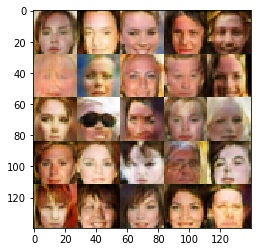

Epoch 2/2... Discriminator Loss: 1.2530... Generator Loss: 0.8177
Epoch 2/2... Discriminator Loss: 1.3036... Generator Loss: 0.7050
Epoch 2/2... Discriminator Loss: 1.4989... Generator Loss: 0.4988
Epoch 2/2... Discriminator Loss: 1.2838... Generator Loss: 0.6898
Epoch 2/2... Discriminator Loss: 1.2559... Generator Loss: 0.7209
Epoch 2/2... Discriminator Loss: 1.2179... Generator Loss: 0.7595
Epoch 2/2... Discriminator Loss: 1.1664... Generator Loss: 0.8615
Epoch 2/2... Discriminator Loss: 1.2833... Generator Loss: 0.6717
Epoch 2/2... Discriminator Loss: 1.0760... Generator Loss: 1.2030
Epoch 2/2... Discriminator Loss: 1.1353... Generator Loss: 0.8361


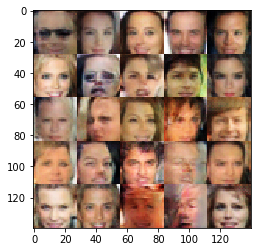

Epoch 2/2... Discriminator Loss: 1.1485... Generator Loss: 0.8160
Epoch 2/2... Discriminator Loss: 1.0088... Generator Loss: 1.0617
Epoch 2/2... Discriminator Loss: 1.2383... Generator Loss: 0.7118
Epoch 2/2... Discriminator Loss: 1.2448... Generator Loss: 0.7336
Epoch 2/2... Discriminator Loss: 1.3839... Generator Loss: 0.6341
Epoch 2/2... Discriminator Loss: 1.3642... Generator Loss: 0.5842
Epoch 2/2... Discriminator Loss: 1.0987... Generator Loss: 0.8046
Epoch 2/2... Discriminator Loss: 1.2855... Generator Loss: 0.6838
Epoch 2/2... Discriminator Loss: 1.3362... Generator Loss: 0.6939
Epoch 2/2... Discriminator Loss: 1.1920... Generator Loss: 0.7593


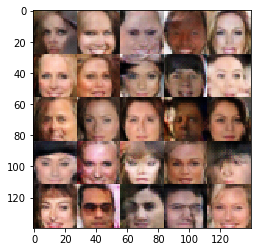

Epoch 2/2... Discriminator Loss: 1.2201... Generator Loss: 0.7618
Epoch 2/2... Discriminator Loss: 1.3196... Generator Loss: 0.5581
Epoch 2/2... Discriminator Loss: 1.2489... Generator Loss: 0.7404
Epoch 2/2... Discriminator Loss: 1.1126... Generator Loss: 0.9043
Epoch 2/2... Discriminator Loss: 1.4351... Generator Loss: 0.5945
Epoch 2/2... Discriminator Loss: 1.2438... Generator Loss: 0.7680
Epoch 2/2... Discriminator Loss: 1.1729... Generator Loss: 0.7088
Epoch 2/2... Discriminator Loss: 1.0773... Generator Loss: 0.9674
Epoch 2/2... Discriminator Loss: 1.3068... Generator Loss: 0.7032
Epoch 2/2... Discriminator Loss: 1.4061... Generator Loss: 0.5817


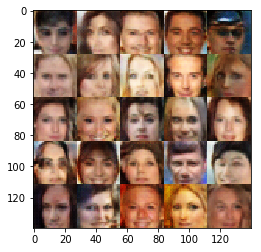

Epoch 2/2... Discriminator Loss: 1.3011... Generator Loss: 0.6666
Epoch 2/2... Discriminator Loss: 1.3033... Generator Loss: 0.6497
Epoch 2/2... Discriminator Loss: 1.2407... Generator Loss: 0.9189
Epoch 2/2... Discriminator Loss: 1.2343... Generator Loss: 0.7262
Epoch 2/2... Discriminator Loss: 1.1925... Generator Loss: 0.8581
Epoch 2/2... Discriminator Loss: 1.1707... Generator Loss: 1.1481
Epoch 2/2... Discriminator Loss: 1.2704... Generator Loss: 0.7420
Epoch 2/2... Discriminator Loss: 1.2482... Generator Loss: 0.7721
Epoch 2/2... Discriminator Loss: 1.1704... Generator Loss: 0.7929
Epoch 2/2... Discriminator Loss: 1.2789... Generator Loss: 0.6242


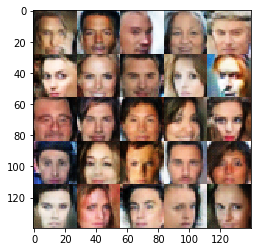

Epoch 2/2... Discriminator Loss: 1.3295... Generator Loss: 0.6640
Epoch 2/2... Discriminator Loss: 1.3138... Generator Loss: 0.6666
Epoch 2/2... Discriminator Loss: 1.3420... Generator Loss: 0.5874
Epoch 2/2... Discriminator Loss: 1.2282... Generator Loss: 0.7270
Epoch 2/2... Discriminator Loss: 1.2678... Generator Loss: 0.6600
Epoch 2/2... Discriminator Loss: 0.9948... Generator Loss: 1.0975
Epoch 2/2... Discriminator Loss: 1.3843... Generator Loss: 0.6829
Epoch 2/2... Discriminator Loss: 1.6771... Generator Loss: 0.4062
Epoch 2/2... Discriminator Loss: 1.5971... Generator Loss: 0.5643
Epoch 2/2... Discriminator Loss: 0.9834... Generator Loss: 1.1299


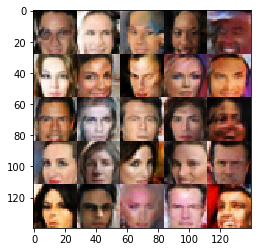

Epoch 2/2... Discriminator Loss: 1.2068... Generator Loss: 0.7235
Epoch 2/2... Discriminator Loss: 1.3777... Generator Loss: 0.6040
Epoch 2/2... Discriminator Loss: 1.1892... Generator Loss: 0.7307
Epoch 2/2... Discriminator Loss: 1.2708... Generator Loss: 0.7240
Epoch 2/2... Discriminator Loss: 1.0238... Generator Loss: 1.0498
Epoch 2/2... Discriminator Loss: 1.2454... Generator Loss: 0.6858
Epoch 2/2... Discriminator Loss: 1.1507... Generator Loss: 0.8425
Epoch 2/2... Discriminator Loss: 1.2406... Generator Loss: 0.7473
Epoch 2/2... Discriminator Loss: 1.4587... Generator Loss: 0.6060
Epoch 2/2... Discriminator Loss: 1.3463... Generator Loss: 0.6764


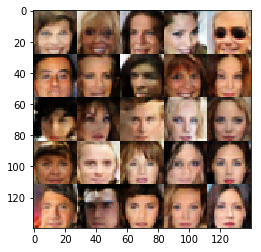

Epoch 2/2... Discriminator Loss: 1.1507... Generator Loss: 0.7608
Epoch 2/2... Discriminator Loss: 1.3591... Generator Loss: 0.6396
Epoch 2/2... Discriminator Loss: 1.2465... Generator Loss: 0.7450
Epoch 2/2... Discriminator Loss: 1.2135... Generator Loss: 0.7402
Epoch 2/2... Discriminator Loss: 1.0427... Generator Loss: 1.0828
Epoch 2/2... Discriminator Loss: 1.4189... Generator Loss: 0.5668
Epoch 2/2... Discriminator Loss: 1.5460... Generator Loss: 0.4889
Epoch 2/2... Discriminator Loss: 1.1852... Generator Loss: 0.7318
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 0.8187
Epoch 2/2... Discriminator Loss: 1.2798... Generator Loss: 0.8179


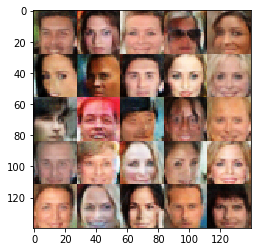

Epoch 2/2... Discriminator Loss: 1.2124... Generator Loss: 0.8143
Epoch 2/2... Discriminator Loss: 1.3339... Generator Loss: 0.7533
Epoch 2/2... Discriminator Loss: 1.3512... Generator Loss: 0.6782
Epoch 2/2... Discriminator Loss: 1.2410... Generator Loss: 0.6832
Epoch 2/2... Discriminator Loss: 1.1082... Generator Loss: 0.9447
Epoch 2/2... Discriminator Loss: 1.2892... Generator Loss: 0.5889
Epoch 2/2... Discriminator Loss: 1.1892... Generator Loss: 0.7980
Epoch 2/2... Discriminator Loss: 1.1541... Generator Loss: 0.7137
Epoch 2/2... Discriminator Loss: 1.4087... Generator Loss: 0.8020
Epoch 2/2... Discriminator Loss: 1.2141... Generator Loss: 0.8240


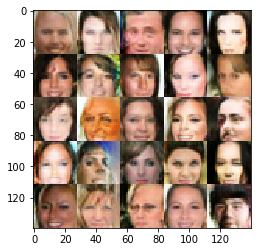

Epoch 2/2... Discriminator Loss: 1.1460... Generator Loss: 0.7657
Epoch 2/2... Discriminator Loss: 1.4327... Generator Loss: 0.5363
Epoch 2/2... Discriminator Loss: 1.5046... Generator Loss: 0.5437
Epoch 2/2... Discriminator Loss: 1.2689... Generator Loss: 0.8280
Epoch 2/2... Discriminator Loss: 1.1948... Generator Loss: 0.8066
Epoch 2/2... Discriminator Loss: 1.1387... Generator Loss: 0.9539
Epoch 2/2... Discriminator Loss: 1.0576... Generator Loss: 0.9512
Epoch 2/2... Discriminator Loss: 1.3016... Generator Loss: 0.6609
Epoch 2/2... Discriminator Loss: 0.9502... Generator Loss: 1.0881
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 0.8071


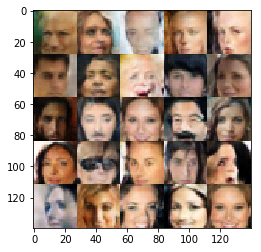

Epoch 2/2... Discriminator Loss: 1.4162... Generator Loss: 0.6078
Epoch 2/2... Discriminator Loss: 1.1052... Generator Loss: 0.8123
Epoch 2/2... Discriminator Loss: 1.2890... Generator Loss: 0.8292
Epoch 2/2... Discriminator Loss: 1.2883... Generator Loss: 0.7260
Epoch 2/2... Discriminator Loss: 1.4281... Generator Loss: 0.5562
Epoch 2/2... Discriminator Loss: 1.1162... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 1.4710... Generator Loss: 0.5141
Epoch 2/2... Discriminator Loss: 1.2276... Generator Loss: 0.6955
Epoch 2/2... Discriminator Loss: 1.2613... Generator Loss: 0.6823
Epoch 2/2... Discriminator Loss: 1.3520... Generator Loss: 0.7242


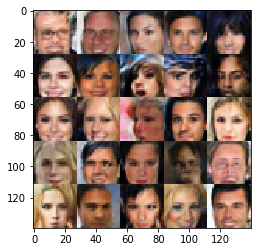

Epoch 2/2... Discriminator Loss: 1.1145... Generator Loss: 1.0077
Epoch 2/2... Discriminator Loss: 0.9996... Generator Loss: 0.9176
Epoch 2/2... Discriminator Loss: 1.2211... Generator Loss: 0.6511
Epoch 2/2... Discriminator Loss: 0.8800... Generator Loss: 1.1223
Epoch 2/2... Discriminator Loss: 1.2138... Generator Loss: 0.9072
Epoch 2/2... Discriminator Loss: 1.1489... Generator Loss: 0.8187
Epoch 2/2... Discriminator Loss: 1.2529... Generator Loss: 0.6877
Epoch 2/2... Discriminator Loss: 1.1604... Generator Loss: 0.7788
Epoch 2/2... Discriminator Loss: 0.9693... Generator Loss: 1.0932
Epoch 2/2... Discriminator Loss: 0.7590... Generator Loss: 1.2704


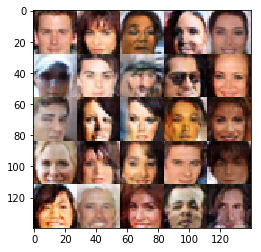

Epoch 2/2... Discriminator Loss: 1.4537... Generator Loss: 0.6103
Epoch 2/2... Discriminator Loss: 1.2902... Generator Loss: 0.6141
Epoch 2/2... Discriminator Loss: 1.3541... Generator Loss: 0.6426
Epoch 2/2... Discriminator Loss: 1.2581... Generator Loss: 0.8405
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 0.9475
Epoch 2/2... Discriminator Loss: 1.3403... Generator Loss: 0.7072
Epoch 2/2... Discriminator Loss: 1.3519... Generator Loss: 0.6136
Epoch 2/2... Discriminator Loss: 1.0948... Generator Loss: 0.9969
Epoch 2/2... Discriminator Loss: 1.1505... Generator Loss: 0.8774
Epoch 2/2... Discriminator Loss: 1.0575... Generator Loss: 0.8834


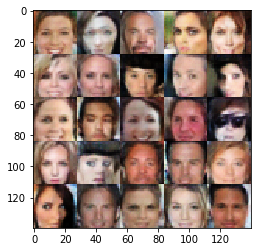

Epoch 2/2... Discriminator Loss: 1.4004... Generator Loss: 0.5729
Epoch 2/2... Discriminator Loss: 1.1704... Generator Loss: 0.8004
Epoch 2/2... Discriminator Loss: 1.0504... Generator Loss: 0.9471
Epoch 2/2... Discriminator Loss: 1.3008... Generator Loss: 0.7103
Epoch 2/2... Discriminator Loss: 1.3510... Generator Loss: 0.6209
Epoch 2/2... Discriminator Loss: 1.3030... Generator Loss: 0.6264
Epoch 2/2... Discriminator Loss: 1.0223... Generator Loss: 0.8615
Epoch 2/2... Discriminator Loss: 1.2632... Generator Loss: 0.7471
Epoch 2/2... Discriminator Loss: 1.3919... Generator Loss: 0.6012
Epoch 2/2... Discriminator Loss: 1.4234... Generator Loss: 0.5664


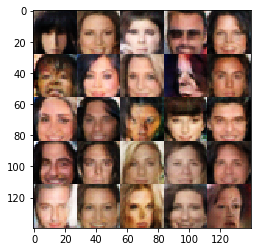

Epoch 2/2... Discriminator Loss: 1.2439... Generator Loss: 0.7319
Epoch 2/2... Discriminator Loss: 1.1928... Generator Loss: 0.7864
Epoch 2/2... Discriminator Loss: 1.0187... Generator Loss: 0.9423
Epoch 2/2... Discriminator Loss: 1.3479... Generator Loss: 0.6716
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 0.9144
Epoch 2/2... Discriminator Loss: 1.2908... Generator Loss: 0.6772


In [27]:
batch_size    = 32
z_dim         = 100
learning_rate = 0.0002
beta1         = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.